In [467]:
import pandas as pd
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
import plotly.graph_objects as go
from numpy.linalg import eig
from scipy.stats.mstats import winsorize
from sklearn.preprocessing import MinMaxScaler,StandardScaler,QuantileTransformer
from sklearn.model_selection import train_test_split,GridSearchCV,cross_val_score
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis as LDA
from sklearn.decomposition import PCA
from sklearn.linear_model import LinearRegression, LogisticRegression
from sklearn.metrics import accuracy_score,classification_report,confusion_matrix, roc_curve, auc
from sklearn.tree import DecisionTreeClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.tree import plot_tree
from sklearn import tree

# Data Preprocessing

Veri setimiz de kolon isimleri olmadığı için öncelikle veri setine kolon isimleri ekleyerek işe başlayalım.

Number of times pregnant:Pregnancies

Plasma glucose concentration a 2 hours in an oral glucose tolerance test : Glucose

Diastolic blood pressure (mm Hg). : BloodPressure

Triceps skinfold thickness (mm). : SkinThickness

2-Hour serum insulin (mu U/ml). : Insulin

Body mass index (weight in kg/(height in m)^2). : BMI

Diabetes pedigree function. : DPF

Age (years). : Age

Class variable (0 or 1). : ClassVariable

In [178]:
column_names = ["Pregnancies", "Glucose", "BloodPressure", "SkinThickness", 
                "Insulin", "BMI", "DPF","Age", "ClassVariable"]

In [179]:
data = pd.read_csv('./data/veri-seti.txt',names=column_names ,delimiter = "\t")

In [180]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 768 entries, 0 to 767
Data columns (total 9 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Pregnancies    768 non-null    int64  
 1   Glucose        768 non-null    int64  
 2   BloodPressure  768 non-null    int64  
 3   SkinThickness  768 non-null    int64  
 4   Insulin        768 non-null    int64  
 5   BMI            768 non-null    float64
 6   DPF            768 non-null    float64
 7   Age            768 non-null    int64  
 8   ClassVariable  768 non-null    int64  
dtypes: float64(2), int64(7)
memory usage: 54.1 KB


datamız 768 satır ve 9 kolondan oluşuyor. datada ki değerlerin hepsi sayısal değerler. iki kolon da ise float değerler söz konusu.

In [181]:
data.head()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DPF,Age,ClassVariable
0,6,148,72,35,0,33.6,0.627,50,1
1,1,85,66,29,0,26.6,0.351,31,0
2,8,183,64,0,0,23.3,0.672,32,1
3,1,89,66,23,94,28.1,0.167,21,0
4,0,137,40,35,168,43.1,2.288,33,1


data da hiç null değer var mı bir bakalım. bu arada ilk 5 veriyi yazdırınca göze çarpan ilk şey datanın bazı kolonlarında 0 verilerinin olduğu. mesela Insulin değerleri arasında 0 verisi var ve bunun olması imkansız. Muhtemelen datada kayıp veri var. buna da bakmamız gerekecek.

In [182]:
print(data.isnull().any())

Pregnancies      False
Glucose          False
BloodPressure    False
SkinThickness    False
Insulin          False
BMI              False
DPF              False
Age              False
ClassVariable    False
dtype: bool


data da hiç null veri yok. birde datanın min max ort ve std verilerine bakalım.

In [183]:
data.describe().T

,count,mean,std,min,25%,50%,75%,max
Pregnancies,768.0,3.845052,3.369578,0.000,1.00000,3.0000,6.00000,17.00
Glucose,768.0,120.894531,31.972618,0.000,99.00000,117.0000,140.25000,199.00
BloodPressure,768.0,69.105469,19.355807,0.000,62.00000,72.0000,80.00000,122.00
SkinThickness,768.0,20.536458,15.952218,0.000,0.00000,23.0000,32.00000,99.00
Insulin,768.0,79.799479,115.244002,0.000,0.00000,30.5000,127.25000,846.00
BMI,768.0,31.992578,7.884160,0.000,27.30000,32.0000,36.60000,67.10
DPF,768.0,0.471876,0.331329,0.078,0.24375,0.3725,0.62625,2.42
Age,768.0,33.240885,11.760232,21.000,24.00000,29.0000,41.00000,81.00
ClassVariable,768.0,0.348958,0.476951,0.000,0.00000,0.0000,1.00000,1.00


Fakat datanın describ'ine baktığımız da min değerleri 0 olan özellikler var.
Aşağıdaki özniteliklerde sıfır değerleri var ve bu öz nitelikleri için sıfır değeri bir anlam ifade etmez ve bu nedenle eksik değerlere işaret eder.

1.Glucose

2.BloodPressure

3.SkinThickness

4.Insulin

5.BMI

bu eksik değerleri NaN olarak değiştirelim ve kaç adet eksik değer varmış bir görelim. eğer eksik değer az ise datadan atabiliriz.

In [184]:
data_copy = data.copy(deep = True)
data_copy[['Glucose','BloodPressure','SkinThickness','Insulin','BMI']] = data_copy[['Glucose','BloodPressure','SkinThickness','Insulin','BMI']].replace(0,np.NaN)

print(data_copy.isnull().sum())

Pregnancies        0
Glucose            5
BloodPressure     35
SkinThickness    227
Insulin          374
BMI               11
DPF                0
Age                0
ClassVariable      0
dtype: int64


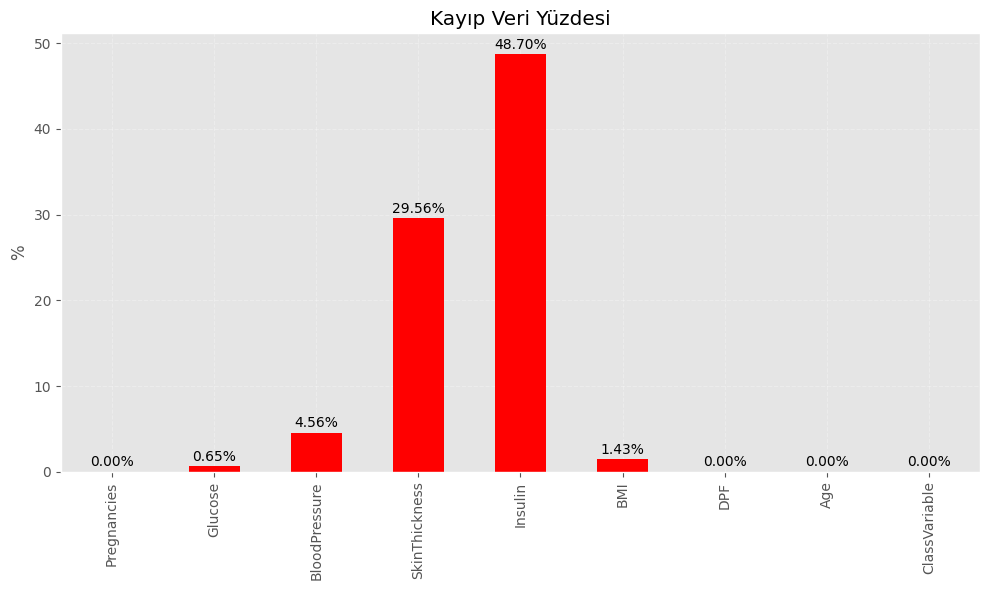

In [185]:
# Veri setindeki kayıp değerlerin yüzdelik oranlarını hesaplayalım
missing_values_percent = (data_copy.isnull().sum() / len(data_copy)) * 100

# Grafik oluşturalım
plt.figure(figsize=(10, 6))
bars = missing_values_percent.plot(kind='bar', color='red')

# Çubukların üzerine yüzde değerlerini yazdıralım
for bar in bars.patches:
    plt.text(bar.get_x() + bar.get_width() / 2, bar.get_height() + 0.3, f"{bar.get_height():.2f}%", ha='center', va='bottom')

plt.title('Kayıp Veri Yüzdesi')
plt.ylabel('%')
plt.grid(axis='x', linestyle='--', alpha=0.3)
plt.grid(axis='y', linestyle='--', alpha=0.3)
plt.tight_layout()
plt.show()

Kayıp Veriler :

Insulin       = 48.70%  - 374

SkinThickness = 29.56%  - 227

BloodPressure = 4.56%   -  35

BMI           = 1.43%   -  11

Glucose       = 0.65%   -   5

Eksik değerler çok fazla olduğu için datadan atmak veri kaybına neden olacak. bu durumda eksik değerleri hangi yöntemle dolduracağımıza karar vermek için histogramına ve boxplotuna bakalım. aykırı değerlerin çokça olduğu veri setlerinde median, olmadığı yada az olduğu veri setlerinde mean yöntemini kullanarak veriyi doldurabiliriz. 

Bir kişinin diyabete yakalanma olasılığını potansiyel olarak etkileyebilecek tüm değişkenlerin histogramlarını çizelim. 

İlk olarak veri çerçevesindeki tüm kişiler için değişkenlerin histogramlarına bakalım.
Daha sonra hasta bireyler için ayrı sağlıklı bireyler için ayrı ayrı histogramlara bakalım.
Bunun için positive ne negative sınıfları ayrı ayrı elde edelim öncelikle.

In [186]:
data_copy_positive = data[data_copy['ClassVariable']==1]
data_copy_positive.head()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DPF,Age,ClassVariable
0,6,148,72,35,0,33.6,0.627,50,1
2,8,183,64,0,0,23.3,0.672,32,1
4,0,137,40,35,168,43.1,2.288,33,1
6,3,78,50,32,88,31.0,0.248,26,1
8,2,197,70,45,543,30.5,0.158,53,1


In [187]:
data_copy_negative = data[data_copy['ClassVariable']==0]
data_copy_negative.head()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DPF,Age,ClassVariable
1,1,85,66,29,0,26.6,0.351,31,0
3,1,89,66,23,94,28.1,0.167,21,0
5,5,116,74,0,0,25.6,0.201,30,0
7,10,115,0,0,0,35.3,0.134,29,0
10,4,110,92,0,0,37.6,0.191,30,0


<Axes: xlabel='Age', ylabel='Count'>

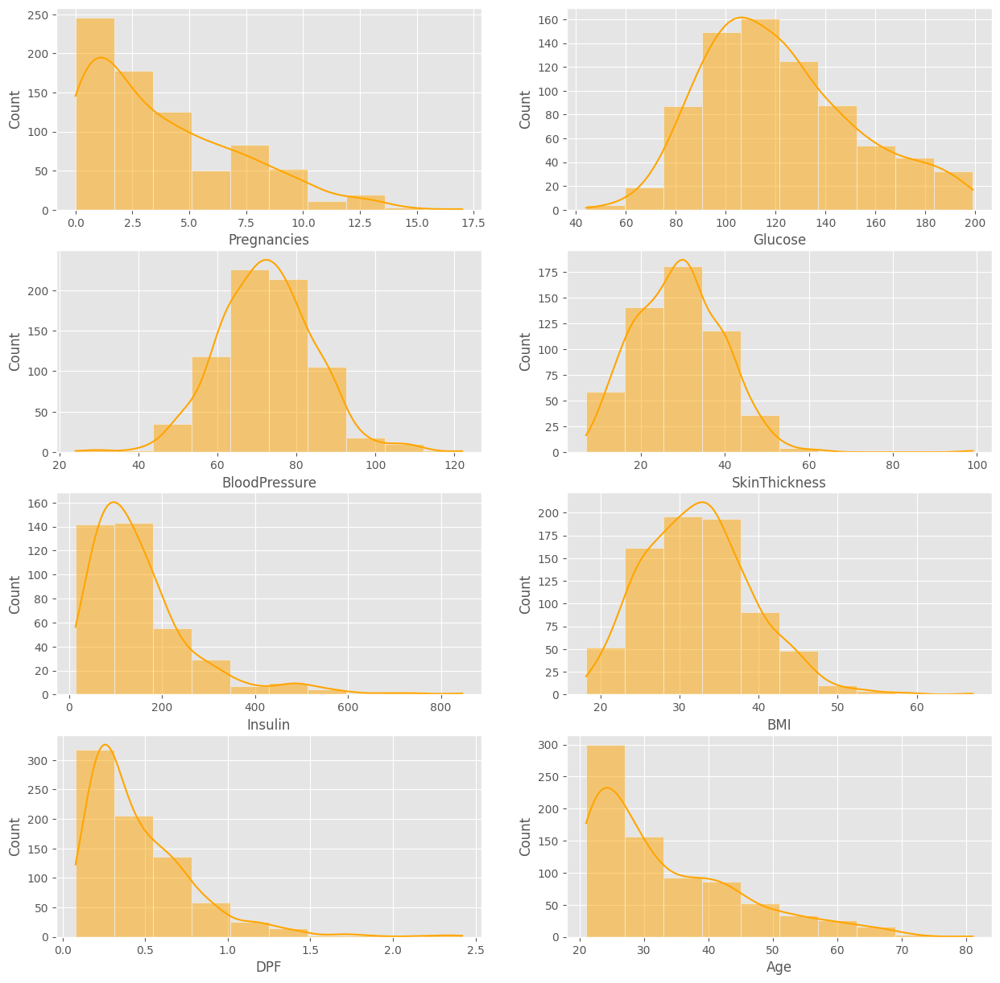

In [188]:
# tüm datanın histogramı
fig, ax = plt.subplots(4,2, figsize=(15,15))
sns.histplot(data_copy.Pregnancies, bins = 10, color = 'orange',kde=True, ax=ax[0,0]) 
sns.histplot(data_copy.Glucose, bins = 10, color = 'orange',kde=True, ax=ax[0,1]) 
sns.histplot(data_copy.BloodPressure, bins = 10, color = 'orange',kde=True, ax=ax[1,0]) 
sns.histplot(data_copy.SkinThickness, bins = 10, color = 'orange',kde=True, ax=ax[1,1]) 
sns.histplot(data_copy.Insulin, bins = 10, color = 'orange',kde=True, ax=ax[2,0])
sns.histplot(data_copy.BMI, bins = 10, color = 'orange',kde=True, ax=ax[2,1])
sns.histplot(data_copy.DPF, bins = 10, color = 'orange',kde=True, ax=ax[3,0]) 
sns.histplot(data_copy.Age, bins = 10,color = 'orange',kde=True, ax=ax[3,1]) 

Şimdi, benzer şekilde, yalnızca veri çerçevesindeki diyabet testi negatif çıkan kişiler için yani sağlıklı kişiler için değişkenlerin histogramlarını çizelim.

<Axes: xlabel='Age', ylabel='Count'>

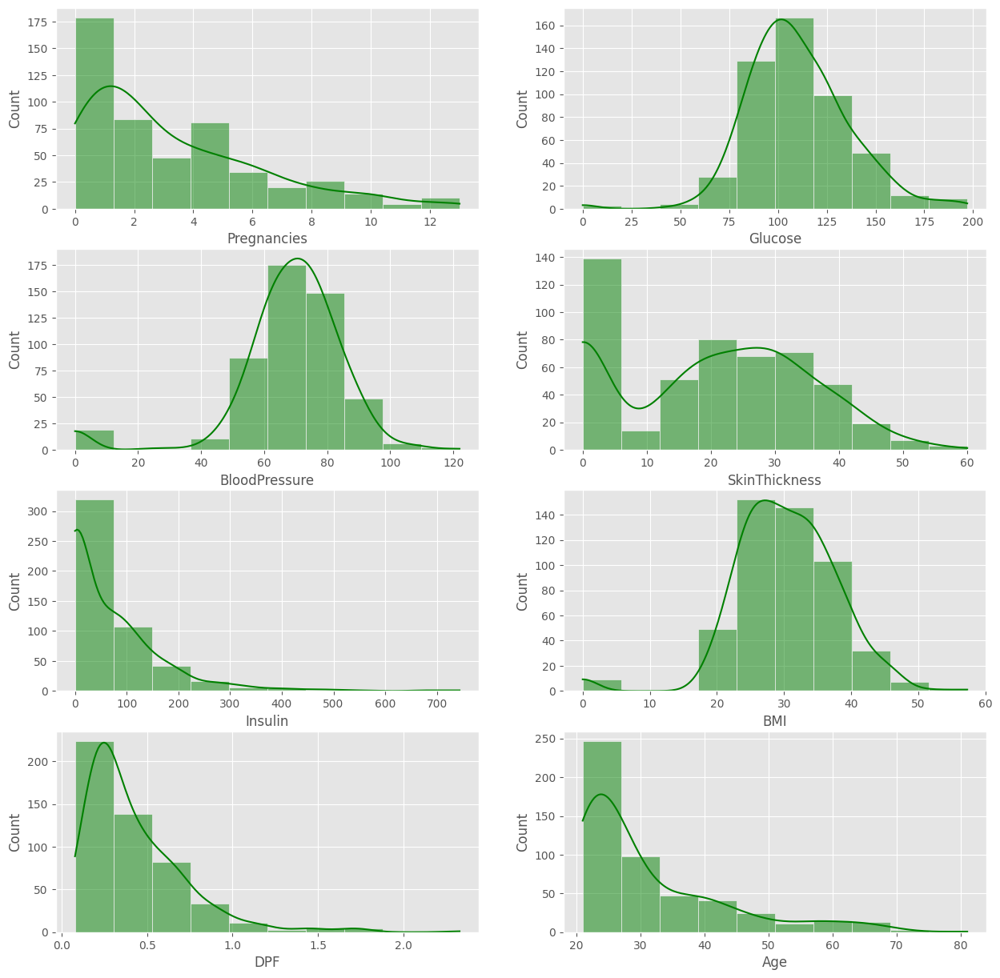

In [189]:
# sağlıklı kşilerin histogramı
fig, ax = plt.subplots(4,2, figsize=(15,15))
sns.histplot(data_copy_negative.Pregnancies, bins = 10, color = 'green',kde=True, ax=ax[0,0]) 
sns.histplot(data_copy_negative.Glucose, bins = 10, color = 'green',kde=True, ax=ax[0,1]) 
sns.histplot(data_copy_negative.BloodPressure, bins = 10, color = 'green',kde=True, ax=ax[1,0]) 
sns.histplot(data_copy_negative.SkinThickness, bins = 10, color = 'green',kde=True, ax=ax[1,1]) 
sns.histplot(data_copy_negative.Insulin, bins = 10, color = 'green',kde=True, ax=ax[2,0])
sns.histplot(data_copy_negative.BMI, bins = 10, color = 'green',kde=True, ax=ax[2,1])
sns.histplot(data_copy_negative.DPF, bins = 10, color = 'green',kde=True, ax=ax[3,0]) 
sns.histplot(data_copy_negative.Age, bins = 10,color = 'green',kde=True, ax=ax[3,1]) 

<Axes: xlabel='Age', ylabel='Count'>

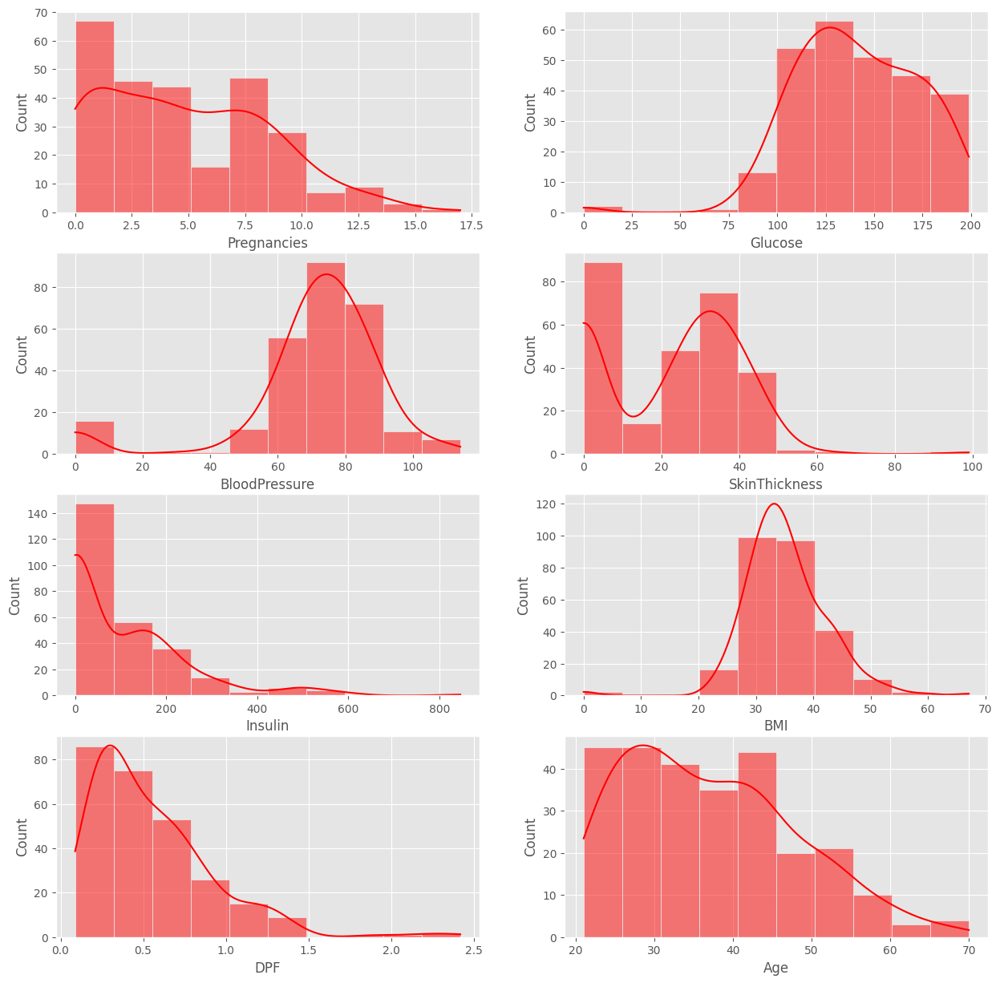

In [190]:
# hasta kşilerin histogramı
fig, ax = plt.subplots(4,2, figsize=(15,15))
sns.histplot(data_copy_positive.Pregnancies, bins = 10, color = 'red',kde=True, ax=ax[0,0]) 
sns.histplot(data_copy_positive.Glucose, bins = 10, color = 'red',kde=True, ax=ax[0,1]) 
sns.histplot(data_copy_positive.BloodPressure, bins = 10, color = 'red',kde=True, ax=ax[1,0]) 
sns.histplot(data_copy_positive.SkinThickness, bins = 10, color = 'red',kde=True, ax=ax[1,1]) 
sns.histplot(data_copy_positive.Insulin, bins = 10, color = 'red',kde=True, ax=ax[2,0])
sns.histplot(data_copy_positive.BMI, bins = 10, color = 'red',kde=True, ax=ax[2,1])
sns.histplot(data_copy_positive.DPF, bins = 10, color = 'red',kde=True, ax=ax[3,0]) 
sns.histplot(data_copy_positive.Age, bins = 10,color = 'red',kde=True, ax=ax[3,1]) 

Tüm eksik değerler NaN değeriyle kodlanmış oldu.
Datanın histogramına  bakıldı ve buradan hareketle bize eksik verilerin tamamlanması için bir fikir verdi.
Burada dikkat edilmesi gereken husus şudur; mean ile doldurulacak kayıp verileri ClassVariable değerlerinin her biri için ayrı ayrı hesaplamak lazım gerektiğidir. Çünkü sağlıklı bir kişinin Insulin değerleri ile hasta kişinin insulin değerleri aynı olmayacaktır. O bakımdan sağlıklı ve hasta veriler için ayrı ayrı mean hesaplanıp kayıp veriler buna dikkat edilerek doldurulması gerekir.
Bunun için bir fonksiyon yazalım ve her bir öznitelik için ortalamaları hasta ve sağlıklı bireyler için ayrı ayrı hesaplayarak kayıp verileri dolduralım.

In [193]:
def mean_target(var):   
    temp = data[data_copy[var].notnull()]
    temp = temp[[var, 'ClassVariable']].groupby(['ClassVariable'])[[var]].mean().reset_index()
    return temp

In [194]:
mean_target('Insulin')

,ClassVariable,Insulin
0,0,130.287879
1,1,206.846154


Etiket değerlerimize göre insülinin medyanları gerçekten farklı! 
Sağlıklı bir kişi için 130.287879 iken diyabetik bir kişi için 206.846154 olmaktadır.Kayıp veriler doldurulurken bu husus göz önünde bulundurularak sağlıklı etiket değerlerinde ki kayıp veriler 130.287879 ile hasta etiket değerinde ki kayıp veriler 206.846154 ile değiştirilmesi gerekir. Bu kural diğer tüm kayıp veri barındıran öznitelikler için aynı şekilde yapılması gerekir. 

In [195]:
data_copy.loc[(data_copy['ClassVariable'] == 0 ) & (data_copy['Insulin'].isnull()), 'Insulin'] = 130.287879
data_copy.loc[(data_copy['ClassVariable'] == 1 ) & (data_copy['Insulin'].isnull()), 'Insulin'] = 206.846154

In [196]:
data.head(5)

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DPF,Age,ClassVariable
0,6,148,72,35,0,33.6,0.627,50,1
1,1,85,66,29,0,26.6,0.351,31,0
2,8,183,64,0,0,23.3,0.672,32,1
3,1,89,66,23,94,28.1,0.167,21,0
4,0,137,40,35,168,43.1,2.288,33,1


In [197]:
data_copy.head(5)

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DPF,Age,ClassVariable
0,6,148.0,72.0,35.0,206.846154,33.6,0.627,50,1
1,1,85.0,66.0,29.0,130.287879,26.6,0.351,31,0
2,8,183.0,64.0,NaN,206.846154,23.3,0.672,32,1
3,1,89.0,66.0,23.0,94.000000,28.1,0.167,21,0
4,0,137.0,40.0,35.0,168.000000,43.1,2.288,33,1


Dikkat edilecek olursa; manipüle edilmemiş data matrisinin ilk 3 insulin değeri 0 idi.data_copy matrisinde bu ilk 3 değer ilgili etiket değerine göre insulin özniteliğinin mean değeri ile değişmiş durumda. 

In [198]:
mean_target('SkinThickness')

,ClassVariable,SkinThickness
0,0,27.235457
1,1,33.000000


In [199]:
data_copy.loc[(data_copy['ClassVariable'] == 0 ) & (data_copy['SkinThickness'].isnull()), 'SkinThickness'] = 27.235457
data_copy.loc[(data_copy['ClassVariable'] == 1 ) & (data_copy['SkinThickness'].isnull()), 'SkinThickness'] = 33.000000

In [200]:
mean_target('BloodPressure')

,ClassVariable,BloodPressure
0,0,70.877339
1,1,75.321429


In [201]:
data_copy.loc[(data_copy['ClassVariable'] == 0 ) & (data_copy['BloodPressure'].isnull()), 'BloodPressure'] = 70.877339
data_copy.loc[(data_copy['ClassVariable'] == 1 ) & (data_copy['BloodPressure'].isnull()), 'BloodPressure'] = 75.321429

In [202]:
mean_target('BMI')

,ClassVariable,BMI
0,0,30.859674
1,1,35.406767


In [203]:
data_copy.loc[(data_copy['ClassVariable'] == 0 ) & (data_copy['BMI'].isnull()), 'BMI'] = 30.859674
data_copy.loc[(data_copy['ClassVariable'] == 1 ) & (data_copy['BMI'].isnull()), 'BMI'] = 35.406767

In [204]:
mean_target('Glucose')

,ClassVariable,Glucose
0,0,110.643863
1,1,142.319549


In [205]:
data_copy.loc[(data_copy['ClassVariable'] == 0 ) & (data_copy['Glucose'].isnull()), 'Glucose'] = 110.643863
data_copy.loc[(data_copy['ClassVariable'] == 1 ) & (data_copy['Glucose'].isnull()), 'Glucose'] = 142.319549

In [206]:
print(data_copy.isnull().sum())

Pregnancies      0
Glucose          0
BloodPressure    0
SkinThickness    0
Insulin          0
BMI              0
DPF              0
Age              0
ClassVariable    0
dtype: int64


In [207]:
data_copy.describe().T

,count,mean,std,min,25%,50%,75%,max
Pregnancies,768.0,3.845052,3.369578,0.000,1.00000,3.000000,6.000000,17.00
Glucose,768.0,121.697358,30.462008,44.000,99.75000,117.000000,141.000000,199.00
BloodPressure,768.0,72.428141,12.106044,24.000,64.00000,72.000000,80.000000,122.00
SkinThickness,768.0,29.247042,8.923908,7.000,25.00000,28.000000,33.000000,99.00
Insulin,768.0,157.003527,88.860914,14.000,121.50000,130.287879,206.846154,846.00
BMI,768.0,32.446420,6.878970,18.200,27.50000,32.050000,36.600000,67.10
DPF,768.0,0.471876,0.331329,0.078,0.24375,0.372500,0.626250,2.42
Age,768.0,33.240885,11.760232,21.000,24.00000,29.000000,41.000000,81.00
ClassVariable,768.0,0.348958,0.476951,0.000,0.00000,0.000000,1.000000,1.00


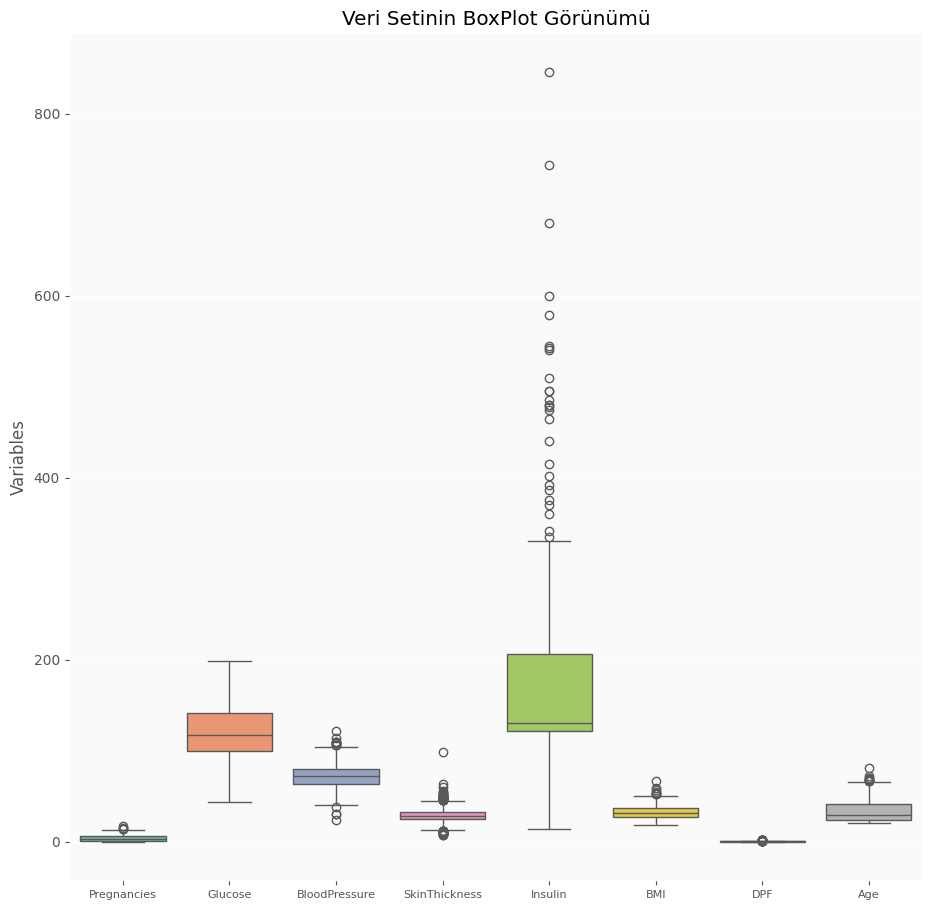

In [208]:
plt.style.use('ggplot') # Using ggplot2 style visuals 

# 'ClassVariable' sütununu veri kümesinden kaldırma
data_no_class = data_copy.drop(columns=['ClassVariable'])

f, ax = plt.subplots(figsize=(11, 11))

ax.set_facecolor('#fafafa')
plt.ylabel('Variables')
plt.title("Veri Setinin BoxPlot Görünümü")
ax = sns.boxplot(data = data_no_class, orient = 'v', palette = 'Set2')
ax.tick_params(axis='x', labelsize=8)

# Winsorization İşlemi

Veri setinde, özellikle Insulin değerlerinde çok fazla aykırı değerler var. Bu aykırı değerleri baskılamanın çeşitli yöntemleri olmakla beraber, Winsorization, veri setindeki aykırı değerlerin etkilerini azaltmak veya ortadan kaldırmak için kullanılan bir yöntemdir. Bu yöntem, veri setindeki en yüksek ve en düşük değerleri sınırlı bir aralığa taşır ve bu sınırlar genellikle verinin yüzde x ve yüzde z dilimleridir. 

Örneğin, %90 Winsorization, verilerin en üst %5 ve en alt %5'inin değiştirilmesi anlamına gelir. Verilerin en üstteki %5'inin yerine 95. yüzdelik dilimdeki verinin değeri, en alttaki %5'in yerine ise 5. yüzdelik dilimdeki verinin değeri yerleştirilir. 

Şimdi Winsorization yapalım.

In [210]:
data_copy_w=data_copy.copy()
data_copy_w["Pregnancies"] = winsorize(data_copy_w["Pregnancies"],(0.01,0.01)) 
data_copy_w["Glucose"] = winsorize(data_copy_w["Glucose"],(0.01,0.01)) 
data_copy_w["BloodPressure"] = winsorize(data_copy_w["BloodPressure"],(0.02,0.02)) 
data_copy_w["SkinThickness"] = winsorize(data_copy_w["SkinThickness"],(0.05,0.05)) 
data_copy_w["Insulin"] = winsorize(data_copy_w["Insulin"],(0.05,0.05)) 
data_copy_w["BMI"] = winsorize(data_copy_w["BMI"],(0.02,0.02)) 
data_copy_w["DPF"] = winsorize(data_copy_w["DPF"],(0.05,0.05)) 
data_copy_w["Age"] = winsorize(data_copy_w["Age"],(0.02,0.02)) 

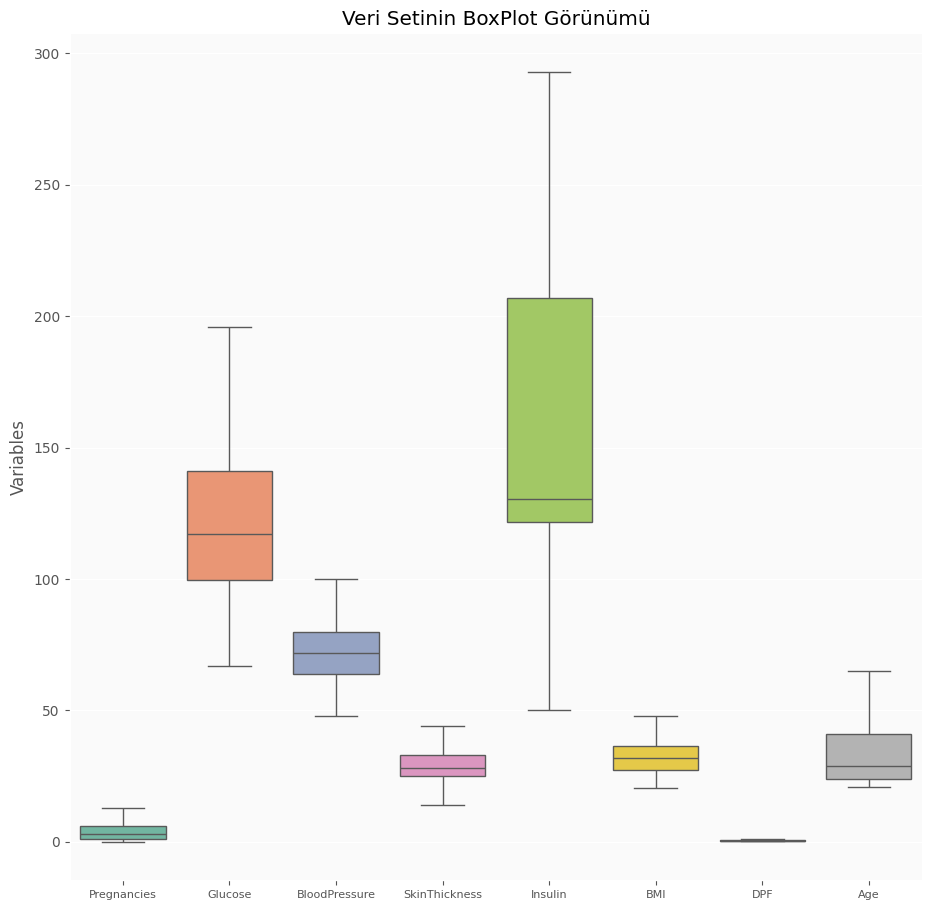

In [211]:
plt.style.use('ggplot') # Using ggplot2 style visuals 

# 'ClassVariable' sütununu veri kümesinden kaldırma
data_no_class_w = data_copy_w.drop(columns=['ClassVariable'])

f, ax = plt.subplots(figsize=(11, 11))

ax.set_facecolor('#fafafa')
plt.ylabel('Variables')
plt.title("Veri Setinin BoxPlot Görünümü")
ax = sns.boxplot(data = data_no_class_w, orient = 'v', palette = 'Set2')
ax.tick_params(axis='x', labelsize=8)


Yukarıda ki boxplotta görüleceği gibi Winsorization yöntemi ile Veri setinde ki aykırı değerler baskılanmış oldu.



Hedefimiz, bir kişinin diyabet hastası olup olmadığını tahmin etmek olduğu için bunu doğru bir şekilde yapabilmek adına tüm kayıp verileri düzeltmiş olduk. Veri çerçevesine baktığımızda, Insulin, SkinThickness, BloodPressure, BMI ve Glucose'da çok sayıda 0 değeri olduğunu gözlemlemiştik. Ancak bu değerlerden herhangi birinin bir kişi için sıfır olması mümkün değildi. Bunun nedeni, tüm bu sıfırların aslında eksik girişler olduğuydu. Bu nedenle, Insulin, SkinThickness, BloodPressure, BMI ve Glucose için 0 değerlerini kaldırdık ve bunları bu sütunların her biri için ortalama değerlerle değiştirdik.

Pregnancies (Hamilelik) sütunundaki 0 değerlerini değiştirmedik. Çünkü bu sadece kişinin hamile olmadığı anlamına gelir,kayıp veri değildir. 


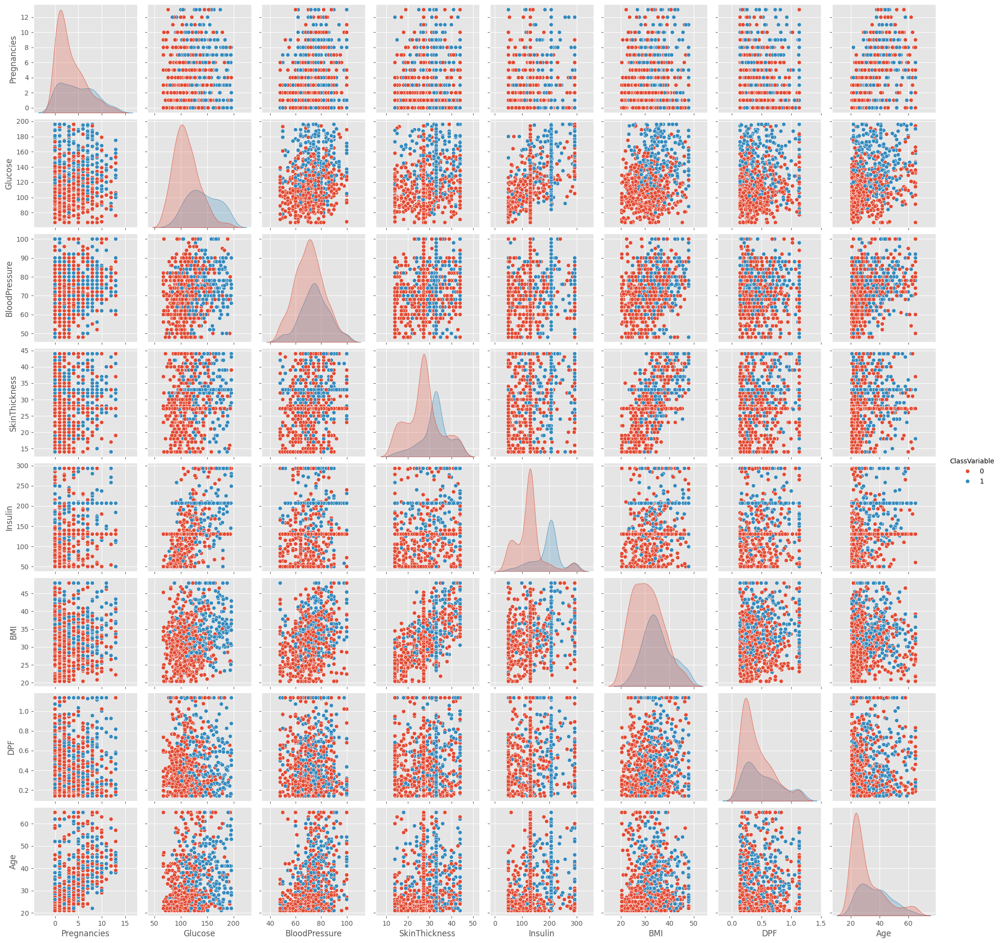

In [222]:
p=sns.pairplot(data_copy_w, hue = 'ClassVariable')

# Data Scaling



In [223]:
scaler = StandardScaler()
X_scaled = pd.DataFrame(scaler.fit_transform(data_copy_w.drop(["ClassVariable"],axis = 1),),
        columns=['Pregnancies', 'Glucose', 'BloodPressure', 'SkinThickness', 'Insulin',
       'BMI', 'DPF', 'Age'])

In [224]:
X_scaled.head()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DPF,Age
0,0.649356,0.867411,-0.036362,0.760256,0.916581,0.187933,0.612465,1.455657
1,-0.850059,-1.216191,-0.565245,-0.008463,-0.324394,-0.883293,-0.383935,-0.188379
2,1.249122,2.024968,-0.741539,0.504016,0.916581,-1.388300,0.774922,-0.101851
3,-0.850059,-1.083899,-0.565245,-0.777181,-0.912604,-0.653745,-1.048202,-1.053662
4,-1.149942,0.503607,-2.151893,0.760256,0.286902,1.641739,2.450030,-0.015323


In [234]:
y = data_copy_w.ClassVariable

# PCA - Principle Component Analiz



In [235]:
pca = PCA(n_components=2)
X_scaled_pca = pca.fit(X_scaled).transform(X_scaled)

In [236]:
eigen_values = pca.explained_variance_
eigen_vectors = pca.components_

In [237]:
eigen_values

array([2.53736107, 1.44601666])

In [238]:
eigen_vectors

array([[ 0.29150831,  0.41396126,  0.35230815,  0.39587606,  0.40969667,
         0.38439516,  0.12677564,  0.36212847],
       [ 0.56133127, -0.05020309,  0.12707832, -0.345834  , -0.11645739,
        -0.44818846, -0.20425368,  0.53896384]])

In [268]:
# En yüksek ağırlığa sahip olan özniteliklerin indekslerini bulma
first_max_index = np.argmax(np.abs(first_component_weights))
second_max_index = np.argmax(np.abs(second_component_weights))

# En yüksek ağırlıklara sahip olan özniteliklerin isimlerini ve değerlerini bulma
first_max_feature = X_scaled.columns[first_max_index]
second_max_feature = X_scaled.columns[second_max_index]

first_max_weight = first_component_weights[first_max_index]
second_max_weight = second_component_weights[second_max_index]

print("En yüksek birinci öz nitelik: {} ({})".format(first_max_feature, first_max_weight))
print("En yüksek ikinci öz nitelik: {} ({})".format(second_max_feature, second_max_weight))

En yüksek birinci öz nitelik: Glucose (0.41396126388395116)
En yüksek ikinci öz nitelik: Pregnancies (0.5613312654215615)


In [240]:
# İlk iki bileşenin varyans oranlarını alalım
explained_variance_ratio = pca.explained_variance_ratio_

# İlk iki bileşenin varyans oranlarını toplayalım
total_variance_explained_ratio = np.sum(explained_variance_ratio[:2])

print("En yüksek özdeğere sahip iki bileşenle orijinal veri setinin açıkladığı varyans oranı: %", np.round(total_variance_explained_ratio*100,2))


En yüksek özdeğere sahip iki bileşenle orijinal veri setinin açıkladığı varyans oranı: % 49.73


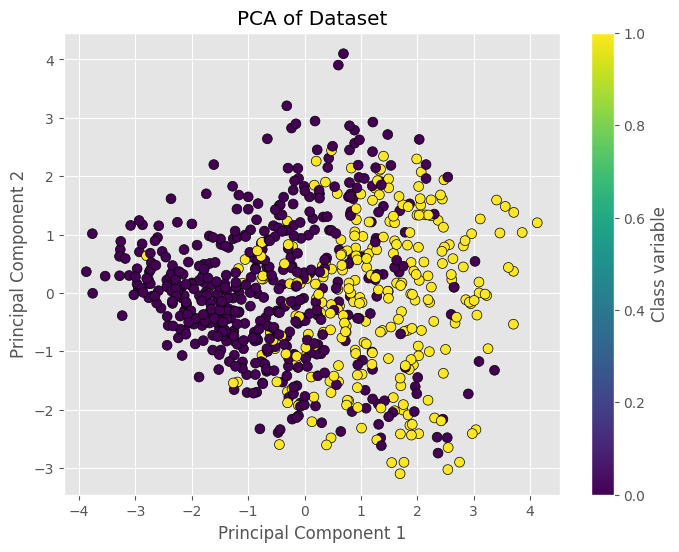

In [367]:
plt.figure(figsize=(8, 6))
plt.scatter(X_scaled_pca[:, 0], X_scaled_pca[:, 1], c=y, cmap='viridis', edgecolor='k', s=50)
plt.title('PCA of Dataset')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.colorbar(label='Class variable')
plt.grid(True)
plt.show()

# LDA- Lineer Discriminant Analiz

In [370]:
lda = LDA(n_components=1) 
X_scaled_lda = lda.fit_transform(X_scaled, y)
print("LDA Components:\n", lda.scalings_)

LDA Components:
 [[ 0.23317097]
 [ 0.52868175]
 [-0.0148683 ]
 [ 0.21403926]
 [ 0.60285831]
 [ 0.19112862]
 [ 0.20604521]
 [ 0.05482666]]


In [371]:
# Öz niteliklerin isimleri
feature_names = X_scaled.columns

# LDA bileşenlerini ve öznitelikleri eşleştirme
lda_components = lda.scalings_.flatten()  # Düzleştirme işlemi
for i, component in enumerate(lda_components):
    feature_name = feature_names[i]  # Öz nitelik ismi
    print(f"{feature_name}: {component}")

Pregnancies: 0.23317097136132806
Glucose: 0.5286817473017336
BloodPressure: -0.014868299508971821
SkinThickness: 0.21403926118125827
Insulin: 0.6028583095850583
BMI: 0.1911286244178455
DPF: 0.20604520528473583
Age: 0.05482666477423917


en yüksek iki öz nitelik Insulin: 0,603 ve Glucose:0.529 

# SPLİT İşlemi

Veri setimizi split etmeden önce etiket verilerimizin dağılımına bakalım.

In [241]:
colors = ['gold', 'mediumturquoise']
labels = ['Sağlıklı','Hasta']
values = data_copy_w['ClassVariable'].value_counts()/data_copy_w['ClassVariable'].shape[0]

# Use `hole` to create a donut-like pie chart
fig = go.Figure(data=[go.Pie(labels=labels, values=values, hole=.3)])
fig.update_traces(hoverinfo='label+percent', textinfo='percent', textfont_size=15,
                  marker=dict(colors=colors, line=dict(color='#000000', width=2)))
fig.update_layout(title_text="ClassVariable", width=400, height=400)
fig.show()

Yukarıdaki grafik verilerin dengesiz olduğunu göstermektedir. 

Sağlıklı bireylerin yüzdesi %65.1, diyabet hastası bireylerin yüzdesi ise %34.9

Bu durumda split işleminde bir detaya dikkat etmek gerekir.

Stratify parametresi, üretilen örneklemin değerlerinin oranının, stratify parametresine verilen değerlerin oranıyla aynı olmasını sağlayarak bir split yapar.

Örneğin, değişken y ikili kategorik bir değişkense ve değerleri 0 ve 1 ise ve sıfırların %25'i ve birlerin %75'i varsa, stratify=y, rastgele bölmenizin %25'inin 0 ve %75'inin 1 olduğundan emin olur.


In [242]:
#Ana Veri setini eğitim ve test verisi olarak ayırma
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.3, random_state=42,stratify=y)

In [251]:
#PCA uygulanmış transformasyon öznitelik matrisini eğitim ve test verisi olarak ayırma
X_train_pca, X_test_pca, y_train_pca, y_test_pca = train_test_split(X_scaled_pca, y, test_size=0.3, random_state=42,stratify=y)

# Ana Veri Seti Çoklu Doğrusal Regresyon Analizi

Çoklu doğrusal regresyon analizi etiket değerlerinin sürekli olduğu durumlarda kullanılır esasında. 

Veri setinde etiket değerlerimiz kategorik (0 ve 1) olduğu için doğrusal bir regresyon analizi iyi sonuçlar vermeyecektir.

Ancak tahmin edilen değerleri sürekli halden bir fonksiyondan geçirerek binary hale getirirsek o zaman lineer regresyon bir sonuç verebilir.

In [374]:
# Çoklu doğrusal regresyon modelini eğitme
linear_reg_model = LinearRegression()
linear_reg_model.fit(X_train, y_train)

LinearRegression()

In [375]:
# Test kümesi üzerinde tahminlerin yapılması
y_pred = linear_reg_model.predict(X_test)

In [376]:
y_pred

array([ 1.12681884e-01,  2.89276616e-01,  5.71823212e-01,  6.77469527e-01,
        6.02345214e-01, -1.78223978e-02,  4.74789609e-01,  1.76871175e-01,
       -7.43122066e-02,  3.35420370e-01, -1.61221636e-01,  1.31582823e-01,
       -1.31957290e-01,  4.35801475e-01,  9.91760062e-01,  9.15015239e-01,
        5.74270944e-01,  4.40015545e-01,  1.01134912e+00,  2.97674902e-01,
        7.07898493e-01,  2.49002261e-01,  9.26350270e-02, -1.15899929e-01,
        9.14622668e-01,  3.23946556e-01,  5.18892427e-01,  4.67947607e-01,
        5.26836005e-02,  1.75991709e-01,  6.88268065e-01,  3.10251804e-01,
        1.05293684e-01,  7.82346113e-02,  5.75408753e-01,  6.93563681e-01,
        3.92964687e-01,  4.65230762e-01,  6.78947845e-01,  3.12102541e-01,
       -6.86199468e-02,  8.62723456e-01,  3.77239108e-02, -1.13409837e-01,
        6.70935041e-02,  8.77700037e-01,  2.97624047e-01,  6.80034148e-01,
        1.27162472e-01,  1.01983826e-01,  2.63417790e-01,  1.16908309e-01,
        8.17187649e-01, -

Tahmin değerlerine bakıldığında negatif ve pozitif değerlerden oluşmakta.

Önce bu değerleri sigmoid fonksiyonu ile normalize edip sonuçları 0 ile 1 arasında bir değere dönüştüreceğim.

Ardından bu normalleştirilmiş değerlere eşik değeri uygulayarak binary tahminler elde edeceğim.

In [377]:
# Sigmoid fonksiyonu tanımlama
def sigmoid(x):
    return 1 / (1 + np.exp(-x))

In [378]:
# Tahminlerin normalize edilmesi
normalized_predictions = sigmoid(y_pred)

In [379]:
normalized_predictions

array([0.5281407 , 0.57181903, 0.63918377, 0.66317369, 0.64619267,
       0.49554452, 0.61651676, 0.54410288, 0.48143049, 0.58307765,
       0.45978167, 0.53284832, 0.46705846, 0.60725815, 0.72943543,
       0.71402534, 0.63974809, 0.60826273, 0.73328409, 0.57387403,
       0.66993664, 0.56193091, 0.52314221, 0.47105741, 0.71394517,
       0.58028576, 0.62688874, 0.61489787, 0.51316785, 0.54388472,
       0.66558154, 0.57694672, 0.52629913, 0.51954868, 0.64001028,
       0.66675922, 0.59699618, 0.61425432, 0.66350383, 0.57739838,
       0.48285174, 0.70322935, 0.50942986, 0.47167789, 0.51676709,
       0.70634539, 0.57386159, 0.66374632, 0.53174785, 0.52547388,
       0.56547627, 0.52919383, 0.69363903, 0.4998457 , 0.67465929,
       0.54538741, 0.52233637, 0.70102193, 0.6245043 , 0.61875756,
       0.4938019 , 0.49367354, 0.62910406, 0.64212251, 0.50589678,
       0.53224577, 0.54122192, 0.57145225, 0.53536998, 0.57696899,
       0.7100533 , 0.62697286, 0.47534324, 0.51407468, 0.51498

In [392]:
# Normalleştirilmiş tahminlerin ortalamasını bulma
mean_normalized_predictions = np.mean(normalized_predictions)

print("Normalleştirilmiş Tahminlerin Ortalaması:", mean_normalized_predictions)

Normalleştirilmiş Tahminlerin Ortalaması: 0.585882711734276


Normalleştirilmiş Tahminlerin Ortalaması: 0.58 çıktığı için eşik değerini 0.6 almaya karar verdim.

0.6 dan küçük değerler 0

0.6 dan büyük değerler 1 olarak işaretlenecek

In [396]:
# Eşik değerini belirleme
threshold = 0.6

# Tahminleri binary hale getirme
binary_predictions = (normalized_predictions > threshold).astype(int)

In [397]:
binary_predictions

array([0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 0, 1, 0,
       0, 0, 1, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 1, 1, 0, 0, 1, 0, 0,
       0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 1, 1, 1, 0, 0, 1, 1, 0, 0,
       0, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 1, 1, 1,
       1, 0, 1, 1, 0, 1, 1, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 1,
       1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0,
       0, 0, 1, 1, 0, 0, 0, 1, 1, 1, 0, 1, 1, 0, 1, 0, 1, 0, 1, 1, 0, 0,
       1, 0, 1, 1, 0, 0, 1, 0, 1, 1, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1,
       0, 0, 0, 0, 1, 1, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1,
       0, 0, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 1, 1, 1, 1, 0, 0, 1, 0, 0, 0,
       1, 1, 0, 0, 0, 1, 0, 0, 1, 1, 0])

Lineer regresyon sonucu oluşan tahminlerimizi binary hale getirmiş olduk.

In [420]:
# Sınıflandırma raporunu oluşturma
class_report = classification_report(y_test, binary_predictions)

print("Ana Veri Seti Çoklu Doğrusal Regresyon Sınıflandırma Raporu:")
print(class_report)

Ana Veri Seti Çoklu Doğrusal Regresyon Sınıflandırma Raporu:
              precision    recall  f1-score   support

           0       0.91      0.79      0.85       150
           1       0.69      0.85      0.76        81

    accuracy                           0.81       231
   macro avg       0.80      0.82      0.80       231
weighted avg       0.83      0.81      0.82       231



In [421]:
# Sınıflandırma raporunu oluşturma
class_report = classification_report(y_test, binary_predictions, output_dict=True)

# Sensitivity (Duyarlılık) hesaplama
sensitivity = class_report['1']['recall']

# Specificity (Özgünlük) hesaplama
specificity = class_report['0']['recall']

print("Ana Veri Seti Çoklu Doğrusal Regresyon Sensitivity:", sensitivity)
print("Ana Veri Seti Çoklu Doğrusal Regresyon Specificity:", specificity)

Ana Veri Seti Çoklu Doğrusal Regresyon Sensitivity: 0.8518518518518519
Ana Veri Seti Çoklu Doğrusal Regresyon Specificity: 0.7933333333333333


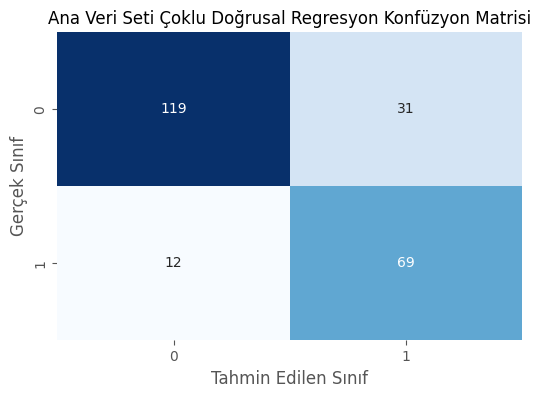

In [425]:
# Konfüzyon matrisini hesaplama
conf_matrix_lrm = confusion_matrix(y_test, binary_predictions)

# Konfüzyon matrisini görselleştirme
plt.figure(figsize=(6, 4))
sns.heatmap(conf_matrix_lrm, annot=True, cmap='Blues', fmt='g', cbar=False)
plt.xlabel('Tahmin Edilen Sınıf')
plt.ylabel('Gerçek Sınıf')
plt.title('Ana Veri Seti Çoklu Doğrusal Regresyon Konfüzyon Matrisi', fontsize=12)
plt.show()

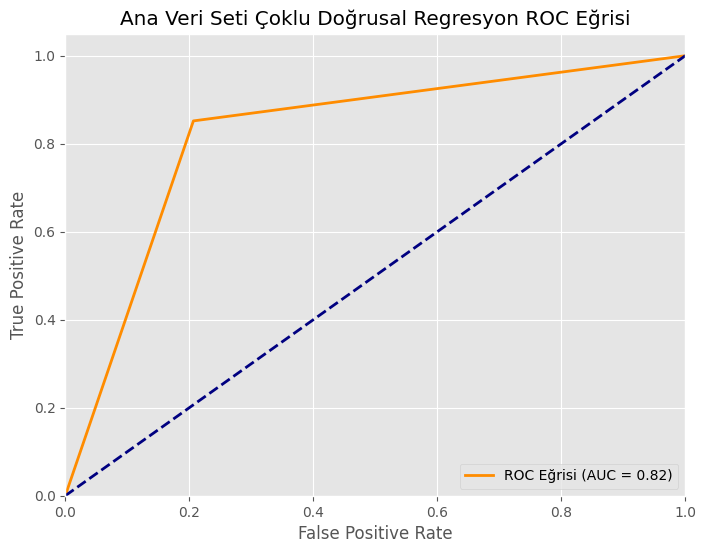

In [426]:
# ROC eğrisini hesaplama
fpr_lrm, tpr_lrm, thresholds_lrm = roc_curve(y_test, binary_predictions)

# ROC eğrisini çizme
plt.figure(figsize=(8, 6))
plt.plot(fpr_lrm, tpr_lrm, color='darkorange', lw=2, label='ROC Eğrisi (AUC = %0.2f)' % auc(fpr_lrm, tpr_lrm))
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Ana Veri Seti Çoklu Doğrusal Regresyon ROC Eğrisi')
plt.legend(loc="lower right")
plt.show()

# PCA Veri Seti Çoklu Doğrusal Regresyon analizi

In [403]:
# PCA-Çoklu doğrusal regresyon modelini eğitme
linear_reg_model_pca = LinearRegression()
linear_reg_model_pca.fit(X_train_pca, y_train_pca)

LinearRegression()

In [404]:
# Test kümesi üzerinde tahminlerin yapılması
y_pred_pca = linear_reg_model_pca.predict(X_test_pca)

In [405]:
y_pred_pca

array([ 0.17552951,  0.42226121,  0.70421715,  0.65366506,  0.78244185,
       -0.16630199,  0.50215364,  0.1578214 , -0.05190175,  0.40779316,
       -0.07588075,  0.09529721, -0.14086103,  0.61034889,  0.81795377,
        0.69272046,  0.55286424,  0.66311741,  0.87978976,  0.34652185,
        0.64614258,  0.22548326,  0.06241763, -0.14601014,  0.86144298,
        0.35168923,  0.54043274,  0.34695347,  0.14728498,  0.15310268,
        0.65673823,  0.31968031,  0.14090088,  0.15320838,  0.15730532,
        0.64887025,  0.37842352,  0.49721932,  0.49584224,  0.2452448 ,
       -0.07988123,  0.63056263,  0.04980808, -0.02008962, -0.00513467,
        0.63556755,  0.2917434 ,  0.60614453,  0.21271528,  0.15836483,
        0.42491413, -0.00454326,  0.73861028, -0.12761398,  0.6388338 ,
        0.15149418,  0.00913303,  0.87452319,  0.39434451,  0.32963288,
       -0.14142924,  0.19479752,  0.56410927,  0.51284804,  0.05941737,
        0.24184288,  0.25601749,  0.39075894,  0.40577226,  0.31

Tahmin değerlerine bakıldığında gene negatif ve pozitif değerlerden oluşmakta.

Önce bu değerleri sigmoid fonksiyonu ile normalize edip sonuçları 0 ile 1 arasında bir değere dönüştüreceğim.

Ardından bu normalleştirilmiş değerlere eşik değeri uygulayarak binary tahminler elde edeceğim.

In [406]:
# Tahminlerin normalize edilmesi
normalized_predictions_pca = sigmoid(y_pred_pca)

In [407]:
normalized_predictions_pca

array([0.54377005, 0.60402421, 0.6691221 , 0.6578359 , 0.68620615,
       0.45852006, 0.62296531, 0.53937366, 0.48702747, 0.6005586 ,
       0.48103891, 0.52380629, 0.46484286, 0.64802039, 0.69380181,
       0.66657183, 0.63479986, 0.65996032, 0.70677865, 0.58577388,
       0.65614068, 0.55613319, 0.51559934, 0.46356218, 0.70296205,
       0.58702715, 0.63191308, 0.58587861, 0.53675483, 0.53820108,
       0.6585273 , 0.57924634, 0.53516706, 0.53822735, 0.53924544,
       0.65675583, 0.59349282, 0.62180564, 0.62148175, 0.56100574,
       0.48004031, 0.65261703, 0.51244945, 0.49497776, 0.49871634,
       0.65375081, 0.57242289, 0.64706082, 0.5529792 , 0.53950867,
       0.60465856, 0.49886419, 0.67669189, 0.46813973, 0.65448979,
       0.53780128, 0.50228324, 0.70568601, 0.59732811, 0.58167005,
       0.46470151, 0.54854597, 0.63740281, 0.62547388, 0.51484997,
       0.56016775, 0.56365705, 0.59646539, 0.60007371, 0.57889752,
       0.68726906, 0.62220015, 0.48930387, 0.52410176, 0.45341

In [408]:
# Normalleştirilmiş tahminlerin ortalamasını bulma
mean_normalized_predictions_pca = np.mean(normalized_predictions_pca)

print("Normalleştirilmiş Tahminlerin Ortalaması:", mean_normalized_predictions_pca)

Normalleştirilmiş Tahminlerin Ortalaması: 0.5842027070373955


Normalleştirilmiş Tahminlerin Ortalaması: 0.58 çıktığı için eşik değerini 0.6 almaya karar verdim.

0.6 dan küçük değerler 0

0.6 dan büyük değerler 1 olarak işaretlenecek

In [409]:
# Eşik değerini belirleme
threshold = 0.6

# Tahminleri binary hale getirme
binary_predictions_pca = (normalized_predictions_pca > threshold).astype(int)

In [410]:
binary_predictions_pca

array([0, 1, 1, 1, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1, 1, 1, 0, 1, 0,
       0, 0, 1, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 1, 0, 0, 1, 0, 0,
       0, 1, 0, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0,
       0, 0, 1, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 1, 1, 1,
       1, 0, 1, 1, 0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 1,
       1, 1, 1, 0, 1, 0, 0, 0, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 1, 1, 0, 0,
       0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0, 1, 1, 1, 0, 0, 0, 0, 1, 1, 0, 1,
       0, 0, 1, 1, 0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 1,
       1, 0, 0, 0, 1, 1, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1,
       0, 0, 0, 0, 0, 1, 0, 1, 1, 0, 1, 0, 0, 1, 1, 1, 0, 0, 1, 0, 0, 1,
       1, 1, 0, 0, 0, 1, 0, 0, 1, 1, 0])

In [427]:
# Sınıflandırma raporunu oluşturma
class_report_pca = classification_report(y_test_pca, binary_predictions_pca)

print("PCA Veri Seti Çoklu Doğrusal Regresyon Sınıflandırma Raporu:")
print(class_report_pca)

PCA Veri Seti Çoklu Doğrusal Regresyon Sınıflandırma Raporu:
              precision    recall  f1-score   support

           0       0.88      0.76      0.81       150
           1       0.64      0.80      0.71        81

    accuracy                           0.77       231
   macro avg       0.76      0.78      0.76       231
weighted avg       0.80      0.77      0.78       231



In [428]:
# Sınıflandırma raporunu oluşturma
class_report_pca = classification_report(y_test_pca, binary_predictions_pca, output_dict=True)

# Sensitivity (Duyarlılık) hesaplama
sensitivity_pca = class_report_pca['1']['recall']

# Specificity (Özgünlük) hesaplama
specificity_pca = class_report_pca['0']['recall']

print("PCA Veri Seti Çoklu Doğrusal Regresyon Sensitivity:", sensitivity_pca)
print("PCA Veri Seti Çoklu Doğrusal Regresyon Specificity:", specificity_pca)

PCA Veri Seti Çoklu Doğrusal Regresyon Sensitivity: 0.8024691358024691
PCA Veri Seti Çoklu Doğrusal Regresyon Specificity: 0.76


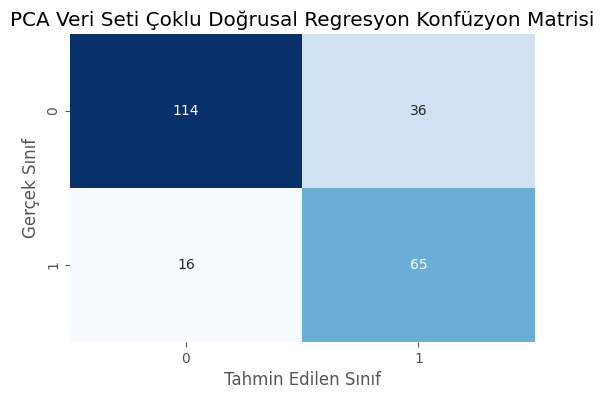

In [429]:
# Konfüzyon matrisini hesaplama
conf_matrix_lrm_pca = confusion_matrix(y_test_pca, binary_predictions_pca)

# Konfüzyon matrisini görselleştirme
plt.figure(figsize=(6, 4))
sns.heatmap(conf_matrix_lrm_pca, annot=True, cmap='Blues', fmt='g', cbar=False)
plt.xlabel('Tahmin Edilen Sınıf')
plt.ylabel('Gerçek Sınıf')
plt.title('PCA Veri Seti Çoklu Doğrusal Regresyon Konfüzyon Matrisi')
plt.show()

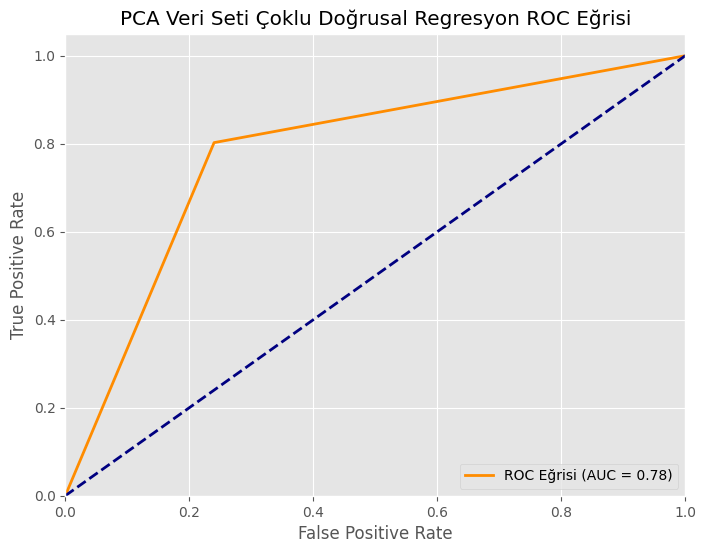

In [430]:
# ROC eğrisini hesaplama
fpr_lrm_pca, tpr_lrm_pca, thresholds_lrm_pca = roc_curve(y_test_pca, binary_predictions_pca)

# ROC eğrisini çizme
plt.figure(figsize=(8, 6))
plt.plot(fpr_lrm_pca, tpr_lrm_pca, color='darkorange', lw=2, label='ROC Eğrisi (AUC = %0.2f)' % auc(fpr_lrm_pca, tpr_lrm_pca))
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('PCA Veri Seti Çoklu Doğrusal Regresyon ROC Eğrisi')
plt.legend(loc="lower right")
plt.show()

# Ana Veri Seti Multinominal Lojistik Regresyon Analizi

In [243]:
# Multinominal Lojistik Regresyon analizi
logistic_reg_model = LogisticRegression(multi_class='multinomial', solver='lbfgs')
logistic_reg_model.fit(X_train, y_train)

LogisticRegression(multi_class='multinomial')

In [244]:
# Öznitelik isimlerini ve katsayıları eşleştirme
feature_names = X_train.columns

# Multinominal Lojistik Regresyon modelinin katsayılarını raporlama
coefficients = logistic_reg_model.coef_
intercept = logistic_reg_model.intercept_

print("Katsayılar:")
for i, coef in enumerate(coefficients):
    for feature_name, value in zip(feature_names, coef):
        print(f"  {feature_name}: {value}")
    print(f"  Sabit terim: {intercept[i]}")
    print()

Katsayılar:
  Pregnancies: 0.1639728657675194
  Glucose: 0.39459966484572423
  BloodPressure: -0.00832909464373067
  SkinThickness: 0.12143313979378385
  Insulin: 0.5346706858235767
  BMI: 0.22820498090197258
  DPF: 0.09370692119935849
  Age: 0.04365055617051808
  Sabit terim: -0.48509632320254975



In [245]:
# Modelin performansını test verisi üzerinde değerlendirme
logistic_reg_predictions = logistic_reg_model.predict(X_test)

In [431]:
# Model performanslarını değerlendirme
logistic_reg_report = classification_report(y_test, logistic_reg_predictions)
print("Ana Veri Seti Multinominal Lojistik Regresyon Sınıflandırma Raporu:")
print(logistic_reg_report)

Ana Veri Seti Multinominal Lojistik Regresyon Sınıflandırma Raporu:
              precision    recall  f1-score   support

           0       0.86      0.87      0.86       150
           1       0.75      0.74      0.75        81

    accuracy                           0.82       231
   macro avg       0.81      0.80      0.80       231
weighted avg       0.82      0.82      0.82       231



In [432]:
# Hassasiyet (Sensitivity) ve Özgünlük (Specificity) hesaplama
conf_matrix_MLR = confusion_matrix(y_test, logistic_reg_predictions)
tn_MLR, fp_MLR, fn_MLR, tp_MLR = conf_matrix_MLR.ravel()
sensitivity_MLR = tp_MLR / (tp_MLR + fn_MLR)
specificity_MLR = tn_MLR / (tn_MLR + fp_MLR)
print("Ana Veri Seti Multinominal Lojistik Regresyon Sensitivity:", sensitivity_MLR)
print("Ana Veri Seti Multinominal Lojistik Regresyon Specificity:", specificity_MLR)

Ana Veri Seti Multinominal Lojistik Regresyon Sensitivity: 0.7407407407407407
Ana Veri Seti Multinominal Lojistik Regresyon Specificity: 0.8666666666666667


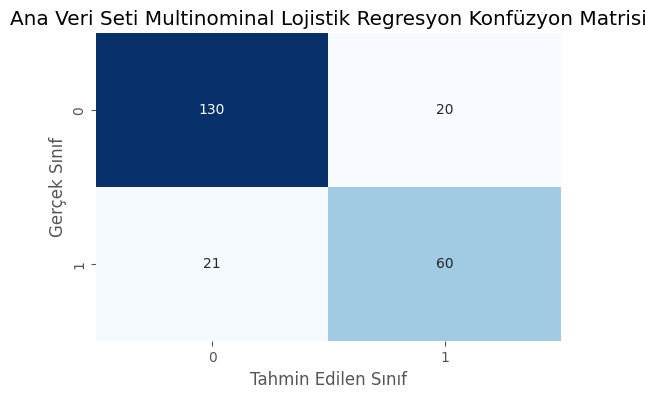

In [433]:
# Konfüzyon matrisi hesaplama
plt.figure(figsize=(6, 4))
sns.heatmap(conf_matrix_MLR, annot=True, cmap='Blues', fmt='g', cbar=False)
plt.xlabel('Tahmin Edilen Sınıf')
plt.ylabel('Gerçek Sınıf')
plt.title('Ana Veri Seti Multinominal Lojistik Regresyon Konfüzyon Matrisi')
plt.show()

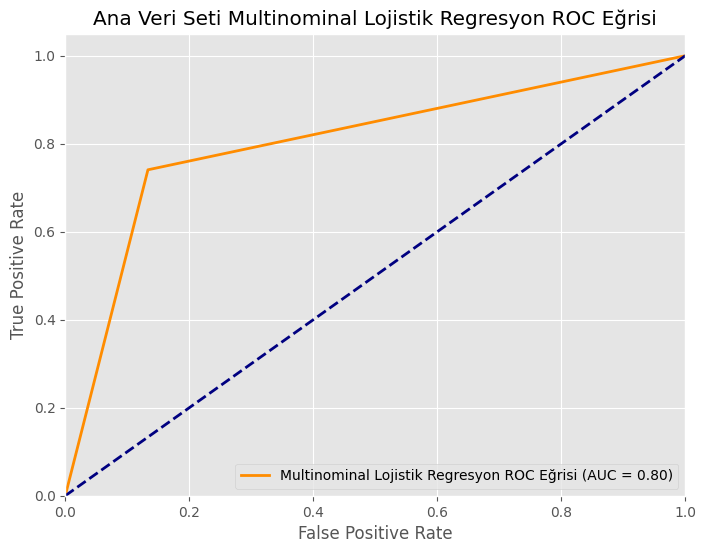

In [434]:
# ROC eğrisi ve AUC hesaplama
fpr_MLR, tpr_MLR, thresholds_MLR = roc_curve(y_test, logistic_reg_predictions)
roc_auc_MLR = auc(fpr_MLR, tpr_MLR)

# ROC eğrisini çizme
plt.figure(figsize=(8, 6))
plt.plot(fpr_MLR, tpr_MLR, color='darkorange', lw=2, label='Multinominal Lojistik Regresyon ROC Eğrisi (AUC = %0.2f)' % roc_auc_MLR)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Ana Veri Seti Multinominal Lojistik Regresyon ROC Eğrisi')
plt.legend(loc="lower right")
plt.show()

# PCA Veri Seti Multinominal Lojistik Regresyon

In [252]:
# PCA uygulanmış transformasyon öznitelik matrisine Multinominal Lojistik Regresyon analizi
logistic_reg_model_pca = LogisticRegression(multi_class='multinomial', solver='lbfgs')
logistic_reg_model_pca.fit(X_train_pca, y_train_pca)

LogisticRegression(multi_class='multinomial')

In [256]:
# Öznitelik isimlerini elde etme
feature_names_pca = pca.get_feature_names_out()

coefficients_pca = logistic_reg_model_pca.coef_
intercept_pca = logistic_reg_model_pca.intercept_

print("Katsayılar:")
for i, coef in enumerate(coefficients_pca):
    for feature_name, value in zip(feature_names_pca, coef):
        print(f"  {feature_name}: {value}")
    print(f"  Sabit terim: {intercept_pca[i]}")
    print()


Katsayılar:
  pca0: 0.5614742949050219
  pca1: -0.11392097777701807
  Sabit terim: -0.4840547137347071



In [257]:
# Modelin performansını test verisi üzerinde değerlendirme
logistic_reg_predictions_pca = logistic_reg_model_pca.predict(X_test_pca)

In [435]:
# Model performanslarını değerlendirme
logistic_reg_report_pca = classification_report(y_test_pca, logistic_reg_predictions_pca)
print("PCA Veri Seti Multinominal Lojistik Regresyon Sınıflandırma Raporu:")
print(logistic_reg_report_pca)

PCA Veri Seti Multinominal Lojistik Regresyon Sınıflandırma Raporu:
              precision    recall  f1-score   support

           0       0.82      0.84      0.83       150
           1       0.69      0.67      0.68        81

    accuracy                           0.78       231
   macro avg       0.76      0.75      0.76       231
weighted avg       0.78      0.78      0.78       231



In [436]:
# Hassasiyet (Sensitivity) ve Özgünlük (Specificity) hesaplama
conf_matrix_MLR_pca = confusion_matrix(y_test_pca, logistic_reg_predictions_pca)
tn_MLR_pca, fp_MLR_pca, fn_MLR_pca, tp_MLR_pca = conf_matrix_MLR_pca.ravel()
sensitivity_MLR_pca = tp_MLR_pca / (tp_MLR_pca + fn_MLR_pca)
specificity_MLR_pca = tn_MLR_pca / (tn_MLR_pca + fp_MLR_pca)
print("PCA Veri Seti Multinominal Lojistik Regresyon Sensitivity:", sensitivity_MLR_pca)
print("PCA Veri Seti Multinominal Lojistik Regresyon Specificity:", specificity_MLR_pca)

PCA Veri Seti Multinominal Lojistik Regresyon Sensitivity: 0.6666666666666666
PCA Veri Seti Multinominal Lojistik Regresyon Specificity: 0.84


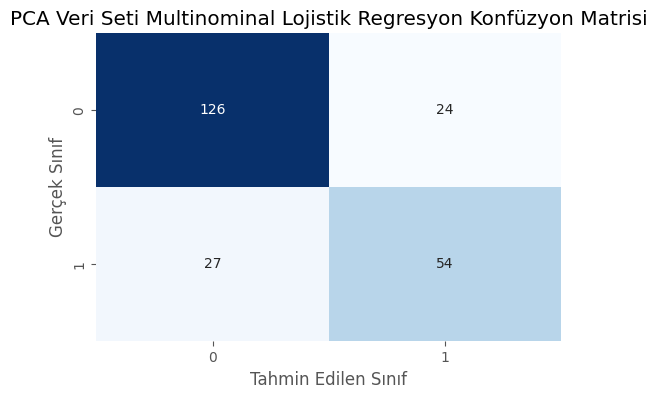

In [437]:
# Konfüzyon matrisi hesaplama
plt.figure(figsize=(6, 4))
sns.heatmap(conf_matrix_MLR_pca, annot=True, cmap='Blues', fmt='g', cbar=False)
plt.xlabel('Tahmin Edilen Sınıf')
plt.ylabel('Gerçek Sınıf')
plt.title('PCA Veri Seti Multinominal Lojistik Regresyon Konfüzyon Matrisi')
plt.show()

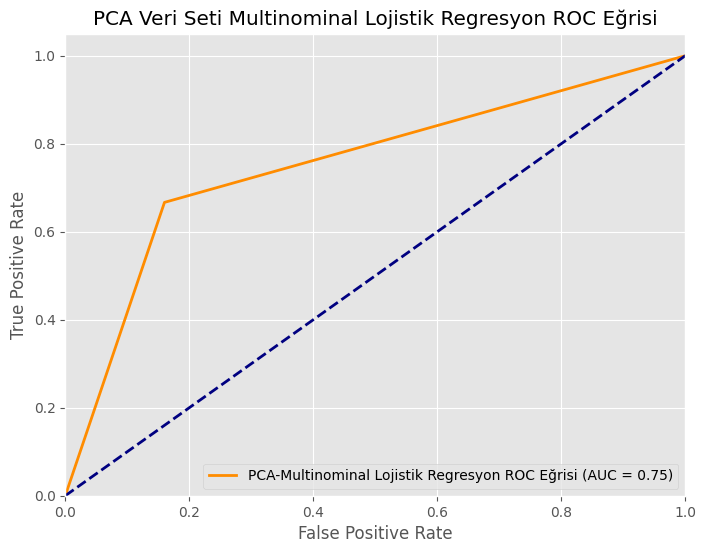

In [438]:
# ROC eğrisi ve AUC hesaplama
fpr_MLR_pca, tpr_MLR_pca, thresholds_MLR_pca = roc_curve(y_test_pca, logistic_reg_predictions_pca)
roc_auc_MLR_pca = auc(fpr_MLR_pca, tpr_MLR_pca)

# ROC eğrisini çizme
plt.figure(figsize=(8, 6))
plt.plot(fpr_MLR_pca, tpr_MLR_pca, color='darkorange', lw=2, label='PCA-Multinominal Lojistik Regresyon ROC Eğrisi (AUC = %0.2f)' % roc_auc_MLR_pca)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('PCA Veri Seti Multinominal Lojistik Regresyon ROC Eğrisi')
plt.legend(loc="lower right")
plt.show()

# Ana Veri Karar Ağaç Sınıflandırma Algoritması

In [312]:
# Karar Ağacı sınıflandırma modelini eğitme
decision_tree_model = DecisionTreeClassifier(random_state=42)
decision_tree_model.fit(X_train, y_train)

DecisionTreeClassifier(random_state=42)

In [313]:
# Test verisi üzerinde modelin performansını değerlendirme ve performans metriklerini hesaplama
decision_tree_predictions = decision_tree_model.predict(X_test)

In [439]:
# Sınıflandırma raporu oluşturma
classification_rep_DT = classification_report(y_test, decision_tree_predictions)
print("Ana Veri Karar Ağaç Sınıflandırma Raporu:")
print(classification_rep_DT)

Ana Veri Karar Ağaç Sınıflandırma Raporu:
              precision    recall  f1-score   support

           0       0.88      0.92      0.90       150
           1       0.84      0.77      0.80        81

    accuracy                           0.87       231
   macro avg       0.86      0.84      0.85       231
weighted avg       0.86      0.87      0.86       231



In [440]:
# Hassasiyet (Sensitivity) ve Özgünlük (Specificity) hesaplama
conf_matrix_DT = confusion_matrix(y_test, decision_tree_predictions)
tn_DT, fp_DT, fn_DT, tp_DT = conf_matrix_DT.ravel()
sensitivity_DT = tp_DT / (tp_DT + fn_DT)
specificity_DT = tn_DT / (tn_DT + fp_DT)
print("Ana Veri Karar Ağaç Sınıflandırma Sensitivity:", sensitivity_DT)
print("Ana Veri Karar Ağaç Sınıflandırma Specificity:", specificity_DT)

Ana Veri Karar Ağaç Sınıflandırma Sensitivity: 0.7654320987654321
Ana Veri Karar Ağaç Sınıflandırma Specificity: 0.92


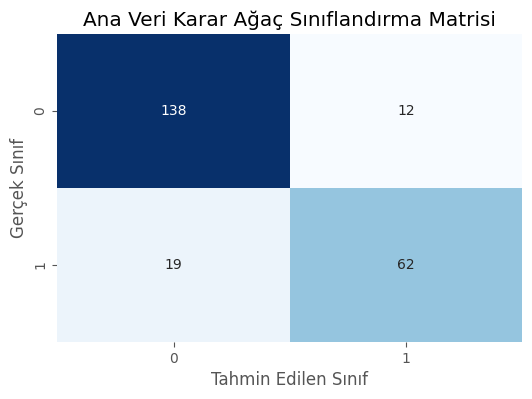

In [441]:
# Konfüzyon matrisi hesaplama
plt.figure(figsize=(6, 4))
sns.heatmap(conf_matrix_DT, annot=True, cmap='Blues', fmt='g', cbar=False)
plt.xlabel('Tahmin Edilen Sınıf')
plt.ylabel('Gerçek Sınıf')
plt.title('Ana Veri Karar Ağaç Sınıflandırma Matrisi')
plt.show()

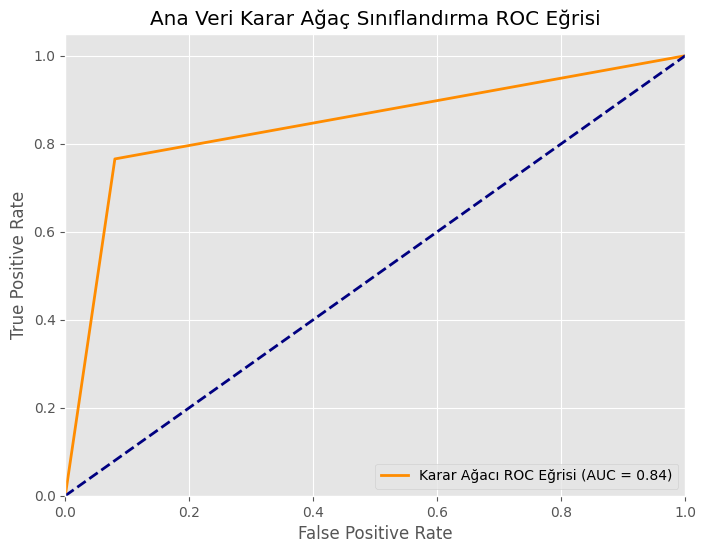

In [442]:
# ROC eğrisi ve AUC hesaplama
fpr_DT, tpr_DT, thresholds_DT = roc_curve(y_test, decision_tree_predictions)
roc_auc_DT = auc(fpr_DT, tpr_DT)

# ROC eğrisini çizme
plt.figure(figsize=(8, 6))
plt.plot(fpr_DT, tpr_DT, color='darkorange', lw=2, label='Karar Ağacı ROC Eğrisi (AUC = %0.2f)' % roc_auc_DT)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Ana Veri Karar Ağaç Sınıflandırma ROC Eğrisi')
plt.legend(loc="lower right")
plt.show()

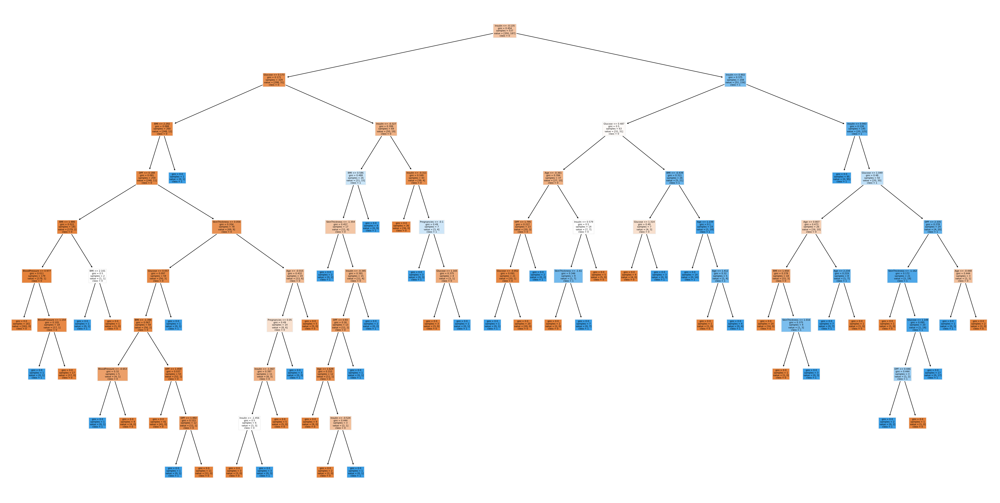

In [318]:
#Karar Ağacı Yapısı
plt.figure(figsize=(20, 10), dpi=300)
plot_tree(decision_tree_model, feature_names=X_scaled.columns, class_names=["0", "1"], filled=True)
plt.show()

# Hyper Tuning

In [319]:
grid_param={"criterion":["gini","entropy"],
             "splitter":["best","random"],
             "max_depth":range(2,50,1),
             "min_samples_leaf":range(1,15,1),
             "min_samples_split":range(2,20,1) 
            }

In [299]:
grid_search=GridSearchCV(estimator=decision_tree_model,param_grid=grid_param,cv=5,n_jobs=-1)

In [300]:
grid_search.fit(X_train,y_train)

GridSearchCV(cv=5, estimator=DecisionTreeClassifier(random_state=42), n_jobs=-1,
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': range(2, 50),
                         'min_samples_leaf': range(1, 15),
                         'min_samples_split': range(2, 20),
                         'splitter': ['best', 'random']})

In [301]:
print(grid_search.best_params_)

{'criterion': 'entropy', 'max_depth': 5, 'min_samples_leaf': 7, 'min_samples_split': 2, 'splitter': 'best'}


In [320]:
# Karar Ağacı sınıflandırma modelini eğitme
decision_tree_model = DecisionTreeClassifier(random_state=42,criterion= 'entropy',max_depth= 5,min_samples_leaf= 7,min_samples_split= 2,splitter= 'best')
decision_tree_model.fit(X_train, y_train)

DecisionTreeClassifier(criterion='entropy', max_depth=5, min_samples_leaf=7,
                       random_state=42)

In [321]:
# Test verisi üzerinde modelin performansını değerlendirme ve performans metriklerini hesaplama
decision_tree_predictions = decision_tree_model.predict(X_test)

In [443]:
# Sınıflandırma raporu oluşturma
classification_rep_DT = classification_report(y_test, decision_tree_predictions)
print("Hypertuning-AnaVeri-Karar Ağaç Sınıflandırma Raporu:")
print(classification_rep_DT)

Hypertuning-AnaVeri-Karar Ağaç Sınıflandırma Raporu:
              precision    recall  f1-score   support

           0       0.88      0.92      0.90       150
           1       0.84      0.77      0.80        81

    accuracy                           0.87       231
   macro avg       0.86      0.84      0.85       231
weighted avg       0.86      0.87      0.86       231



In [444]:
# Hassasiyet (Sensitivity) ve Özgünlük (Specificity) hesaplama
conf_matrix_DT = confusion_matrix(y_test, decision_tree_predictions)
tn_DT, fp_DT, fn_DT, tp_DT = conf_matrix_DT.ravel()
sensitivity_DT = tp_DT / (tp_DT + fn_DT)
specificity_DT = tn_DT / (tn_DT + fp_DT)
print("Hypertuning-AnaVeri-Karar Ağaç Sensitivity:", sensitivity_DT)
print("Hypertuning-AnaVeri-Karar Ağaç Specificity:", specificity_DT)

Hypertuning-AnaVeri-Karar Ağaç Sensitivity: 0.7654320987654321
Hypertuning-AnaVeri-Karar Ağaç Specificity: 0.92


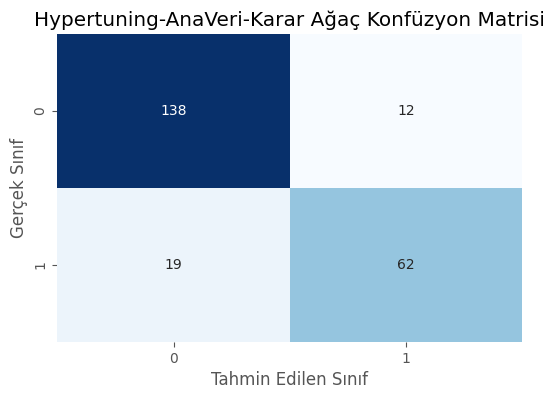

In [445]:
# Konfüzyon matrisi hesaplama
plt.figure(figsize=(6, 4))
sns.heatmap(conf_matrix_DT, annot=True, cmap='Blues', fmt='g', cbar=False)
plt.xlabel('Tahmin Edilen Sınıf')
plt.ylabel('Gerçek Sınıf')
plt.title('Hypertuning-AnaVeri-Karar Ağaç Konfüzyon Matrisi')
plt.show()

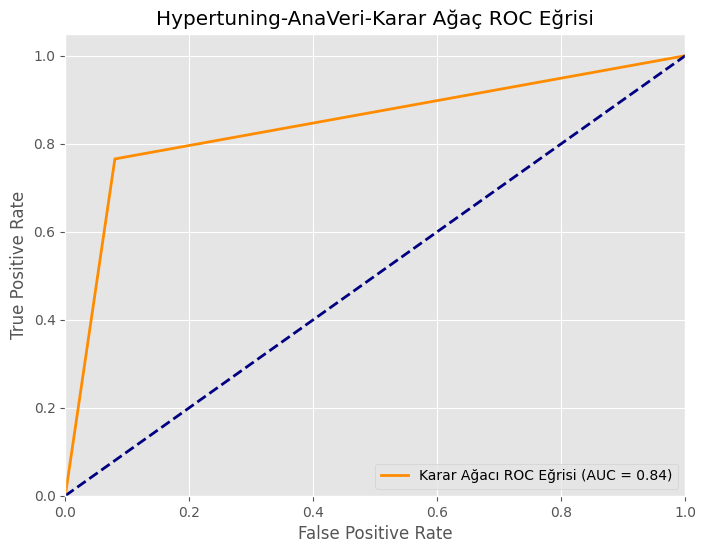

In [446]:
# ROC eğrisi ve AUC hesaplama
fpr_DT, tpr_DT, thresholds_DT = roc_curve(y_test, decision_tree_predictions)
roc_auc_DT = auc(fpr_DT, tpr_DT)

# ROC eğrisini çizme
plt.figure(figsize=(8, 6))
plt.plot(fpr_DT, tpr_DT, color='darkorange', lw=2, label='Karar Ağacı ROC Eğrisi (AUC = %0.2f)' % roc_auc_DT)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Hypertuning-AnaVeri-Karar Ağaç ROC Eğrisi')
plt.legend(loc="lower right")
plt.show()

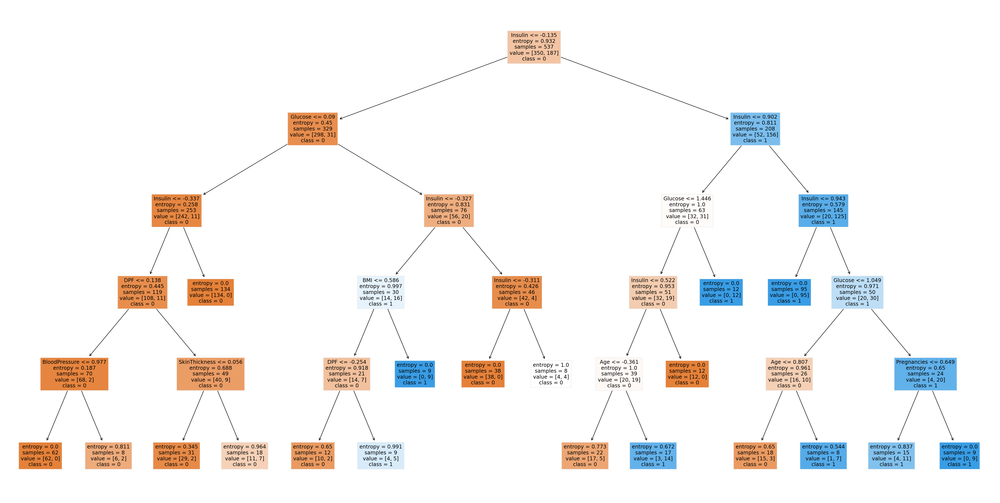

In [326]:
#Karar Ağacı Yapısı
plt.figure(figsize=(20, 10), dpi=300)
plot_tree(decision_tree_model, feature_names=X_scaled.columns, class_names=["0", "1"], filled=True)
plt.show()

# Post Pruning

In [327]:
path=decision_tree_model.cost_complexity_pruning_path(X_train,y_train)
#path variable gives two things ccp_alphas and impurities
ccp_alphas,impurities=path.ccp_alphas,path.impurities
print("ccp alpha wil give list of values :",ccp_alphas)
print("***********************************************************")
print("Impurities in Decision Tree :",impurities)

ccp alpha wil give list of values : [0.         0.00477516 0.00568143 0.01054428 0.01182231 0.01573377
 0.01875519 0.01977567 0.02161363 0.02304843 0.02547819 0.02682585
 0.03671587 0.05326794 0.34228629]
***********************************************************
Impurities in Decision Tree : [0.21657498 0.22135013 0.22703156 0.23757584 0.26122045 0.292688
 0.33019838 0.34997405 0.37158768 0.39463611 0.42011429 0.44694014
 0.48365601 0.59019189 0.93247818]


In [328]:
clfs=[]   #will store all the models here
for ccp_alpha in ccp_alphas:
    clf=DecisionTreeClassifier(random_state=42,ccp_alpha=ccp_alpha)
    clf.fit(X_train,y_train)
    clfs.append(clf)
print("Last node in Decision tree is {} and ccp_alpha for last node is {}".format(clfs[-1].tree_.node_count,ccp_alphas[-1]))

Last node in Decision tree is 1 and ccp_alpha for last node is 0.3422862856819118


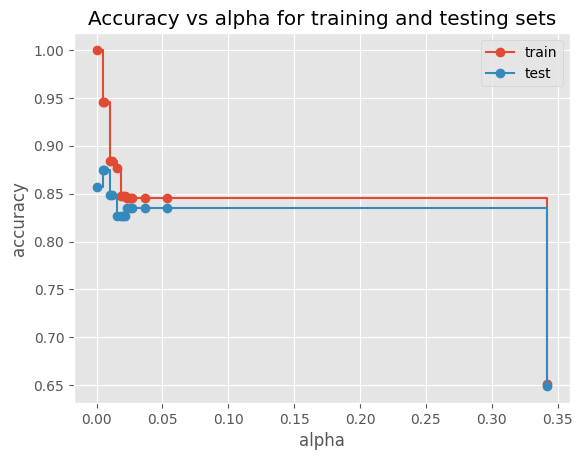

In [329]:
train_scores = [clf.score(X_train, y_train) for clf in clfs]
test_scores = [clf.score(X_test, y_test) for clf in clfs]
fig, ax = plt.subplots()
ax.set_xlabel("alpha")
ax.set_ylabel("accuracy")
ax.set_title("Accuracy vs alpha for training and testing sets")
ax.plot(ccp_alphas, train_scores, marker='o', label="train",drawstyle="steps-post")
ax.plot(ccp_alphas, test_scores, marker='o', label="test",drawstyle="steps-post")
ax.legend()
plt.show()

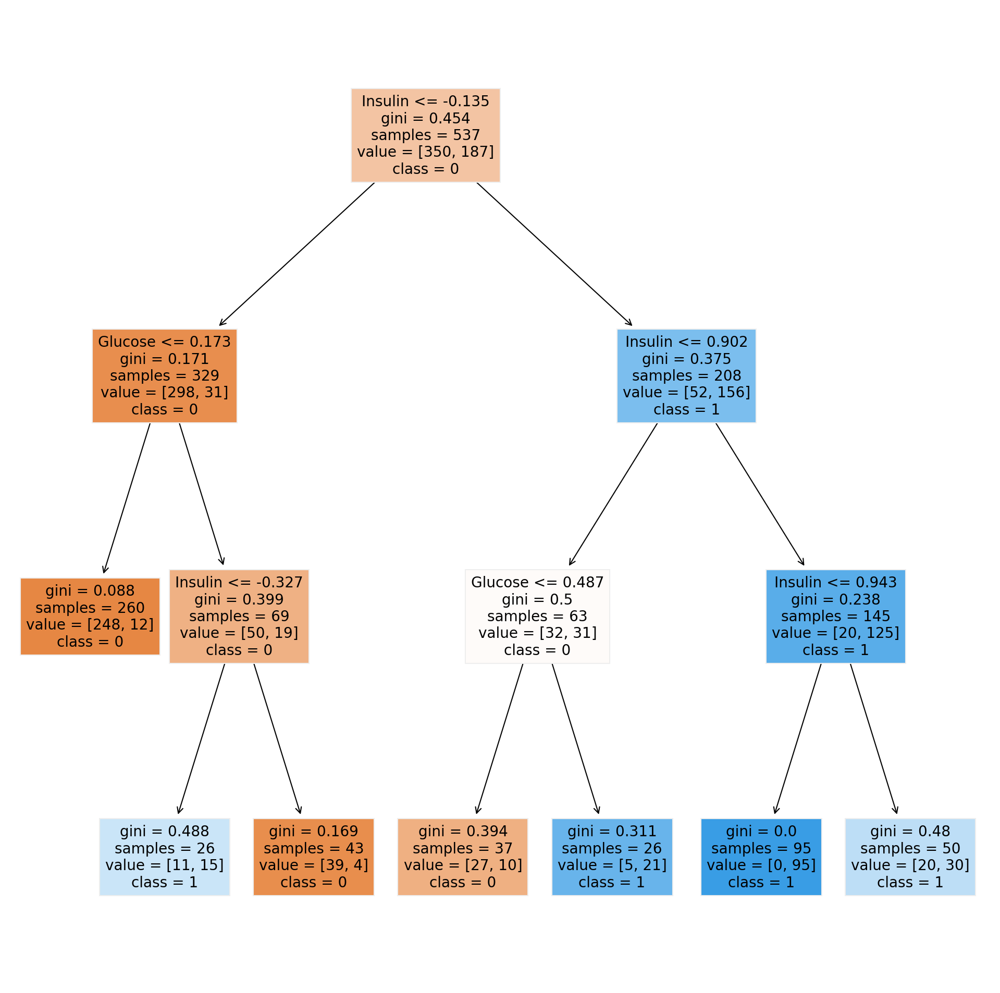

In [340]:
clf=DecisionTreeClassifier(random_state=42,ccp_alpha=0.01)
clf.fit(X_train,y_train)
plt.figure(figsize=(8,8), dpi=300)
plot_tree(clf, feature_names=X_scaled.columns, class_names=["0", "1"], filled=True)
plt.show()

In [341]:
accuracy_score(y_test,clf.predict(X_test))

0.8484848484848485

# PCA Veri Seti Karar Ağaç Sınıflandırma Algoritması

In [276]:
# PCA-Karar Ağacı sınıflandırma modelini eğitme
decision_tree_model_pca = DecisionTreeClassifier(random_state=42)
decision_tree_model_pca.fit(X_train_pca, y_train_pca)

DecisionTreeClassifier(random_state=42)

In [277]:
# Test verisi üzerinde modelin performansını değerlendirme ve performans metriklerini hesaplama
decision_tree_predictions_pca = decision_tree_model_pca.predict(X_test_pca)

In [447]:
# Sınıflandırma raporu oluşturma
classification_rep_DT_pca = classification_report(y_test_pca, decision_tree_predictions_pca)
print("PCA Veri Seti Karar Ağaç Sınıflandırma Raporu:")
print(classification_rep_DT_pca)

PCA Veri Seti Karar Ağaç Sınıflandırma Raporu:
              precision    recall  f1-score   support

           0       0.82      0.83      0.83       150
           1       0.68      0.65      0.67        81

    accuracy                           0.77       231
   macro avg       0.75      0.74      0.75       231
weighted avg       0.77      0.77      0.77       231



In [448]:
# Hassasiyet (Sensitivity) ve Özgünlük (Specificity) hesaplama
conf_matrix_DT_pca = confusion_matrix(y_test_pca, decision_tree_predictions_pca)
tn_DT_pca, fp_DT_pca, fn_DT_pca, tp_DT_pca = conf_matrix_DT_pca.ravel()
sensitivity_DT_pca = tp_DT_pca / (tp_DT_pca + fn_DT_pca)
specificity_DT_pca = tn_DT_pca / (tn_DT_pca + fp_DT_pca)
print("PCA Veri Seti Karar Ağaç Sensitivity:", sensitivity_DT_pca)
print("PCA Veri Seti Karar Ağaç Specificity:", specificity_DT_pca)

PCA Veri Seti Karar Ağaç Sensitivity: 0.654320987654321
PCA Veri Seti Karar Ağaç Specificity: 0.8333333333333334


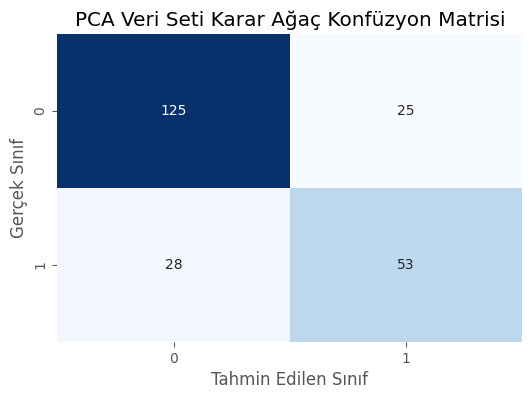

In [449]:
# Konfüzyon matrisi hesaplama
plt.figure(figsize=(6, 4))
sns.heatmap(conf_matrix_DT_pca, annot=True, cmap='Blues', fmt='g', cbar=False)
plt.xlabel('Tahmin Edilen Sınıf')
plt.ylabel('Gerçek Sınıf')
plt.title('PCA Veri Seti Karar Ağaç Konfüzyon Matrisi')
plt.show()

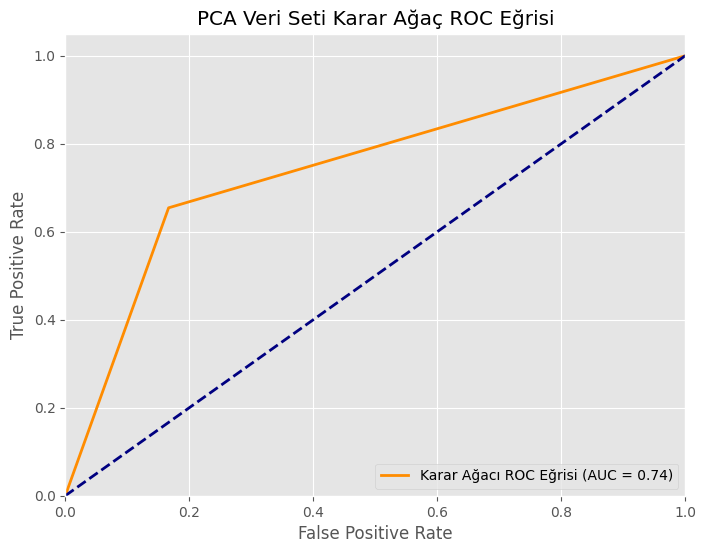

In [450]:
# ROC eğrisi ve AUC hesaplama
fpr_DT_pca, tpr_DT_pca, thresholds_DT_pca = roc_curve(y_test_pca, decision_tree_predictions_pca)
roc_auc_DT_pca = auc(fpr_DT_pca, tpr_DT_pca)

# ROC eğrisini çizme
plt.figure(figsize=(8, 6))
plt.plot(fpr_DT_pca, tpr_DT_pca, color='darkorange', lw=2, label='Karar Ağacı ROC Eğrisi (AUC = %0.2f)' % roc_auc_DT_pca)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('PCA Veri Seti Karar Ağaç ROC Eğrisi')
plt.legend(loc="lower right")
plt.show()

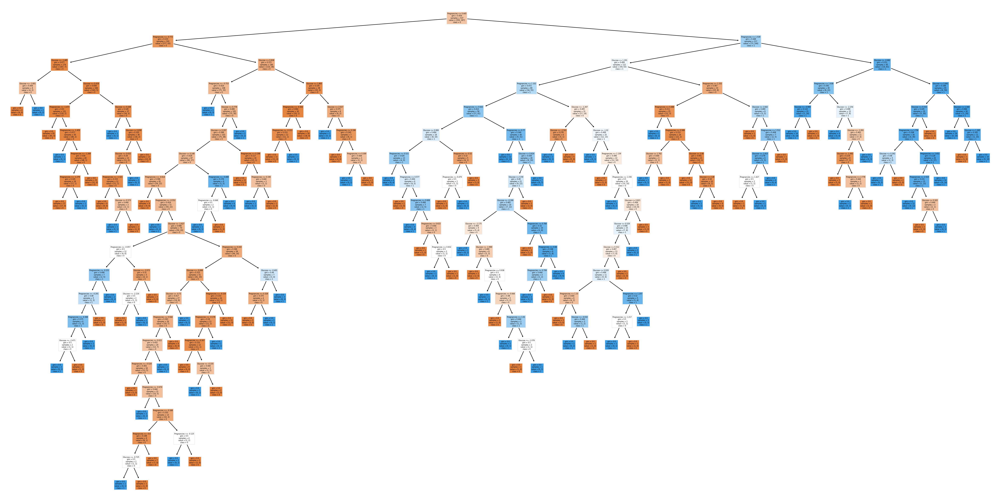

In [342]:
#Karar Ağacı Yapısı
plt.figure(figsize=(20, 10), dpi=300)
plot_tree(decision_tree_model_pca, feature_names=X_scaled.columns, class_names=["0", "1"], filled=True)
plt.show()

# Hyper Tuning

In [343]:
grid_param_pca={"criterion":["gini","entropy"],
             "splitter":["best","random"],
             "max_depth":range(2,50,1),
             "min_samples_leaf":range(1,15,1),
             "min_samples_split":range(2,20,1) 
            }

In [344]:
grid_search_pca=GridSearchCV(estimator=decision_tree_model_pca,param_grid=grid_param_pca,cv=5,n_jobs=-1)

In [345]:
grid_search_pca.fit(X_train_pca,y_train_pca)

GridSearchCV(cv=5, estimator=DecisionTreeClassifier(random_state=42), n_jobs=-1,
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': range(2, 50),
                         'min_samples_leaf': range(1, 15),
                         'min_samples_split': range(2, 20),
                         'splitter': ['best', 'random']})

In [346]:
print(grid_search.best_params_)

{'criterion': 'entropy', 'max_depth': 5, 'min_samples_leaf': 7, 'min_samples_split': 2, 'splitter': 'best'}


In [347]:
# Karar Ağacı sınıflandırma modelini eğitme
decision_tree_model_pca = DecisionTreeClassifier(random_state=42,criterion= 'entropy',max_depth= 5,min_samples_leaf= 7,min_samples_split= 2,splitter= 'best')
decision_tree_model_pca.fit(X_train_pca, y_train_pca)

DecisionTreeClassifier(criterion='entropy', max_depth=5, min_samples_leaf=7,
                       random_state=42)

In [348]:
# Test verisi üzerinde modelin performansını değerlendirme ve performans metriklerini hesaplama
decision_tree_predictions_pca = decision_tree_model_pca.predict(X_test_pca)

In [451]:
# Sınıflandırma raporu oluşturma
classification_rep_DT_pca = classification_report(y_test_pca, decision_tree_predictions_pca)
print("HyperT-PCA Veri Seti Karar Ağaç Sınıflandırma Raporu:")
print(classification_rep_DT_pca)

HyperT-PCA Veri Seti Karar Ağaç Sınıflandırma Raporu:
              precision    recall  f1-score   support

           0       0.82      0.83      0.83       150
           1       0.68      0.65      0.67        81

    accuracy                           0.77       231
   macro avg       0.75      0.74      0.75       231
weighted avg       0.77      0.77      0.77       231



In [452]:
# Hassasiyet (Sensitivity) ve Özgünlük (Specificity) hesaplama
conf_matrix_DT_pca = confusion_matrix(y_test_pca, decision_tree_predictions_pca)
tn_DT_pca, fp_DT_pca, fn_DT_pca, tp_DT_pca = conf_matrix_DT_pca.ravel()
sensitivity_DT_pca = tp_DT_pca / (tp_DT_pca + fn_DT_pca)
specificity_DT_pca = tn_DT_pca / (tn_DT_pca + fp_DT_pca)
print("HyperT-PCA Veri Seti Karar Ağaç Sensitivity:", sensitivity_DT_pca)
print("HyperT-PCA Veri Seti Karar Ağaç Specificity:", specificity_DT_pca)

HyperT-PCA Veri Seti Karar Ağaç Sensitivity: 0.654320987654321
HyperT-PCA Veri Seti Karar Ağaç Specificity: 0.8333333333333334


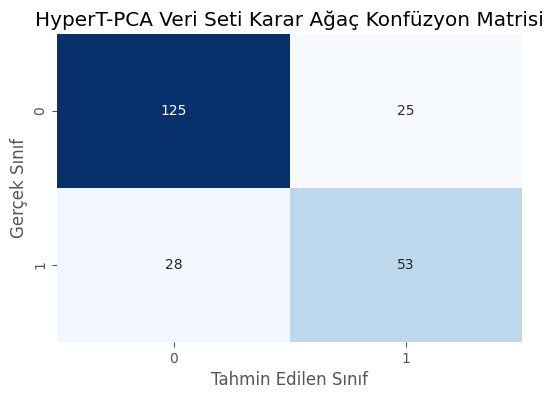

In [453]:
# Konfüzyon matrisi hesaplama
plt.figure(figsize=(6, 4))
sns.heatmap(conf_matrix_DT_pca, annot=True, cmap='Blues', fmt='g', cbar=False)
plt.xlabel('Tahmin Edilen Sınıf')
plt.ylabel('Gerçek Sınıf')
plt.title('HyperT-PCA Veri Seti Karar Ağaç Konfüzyon Matrisi')
plt.show()

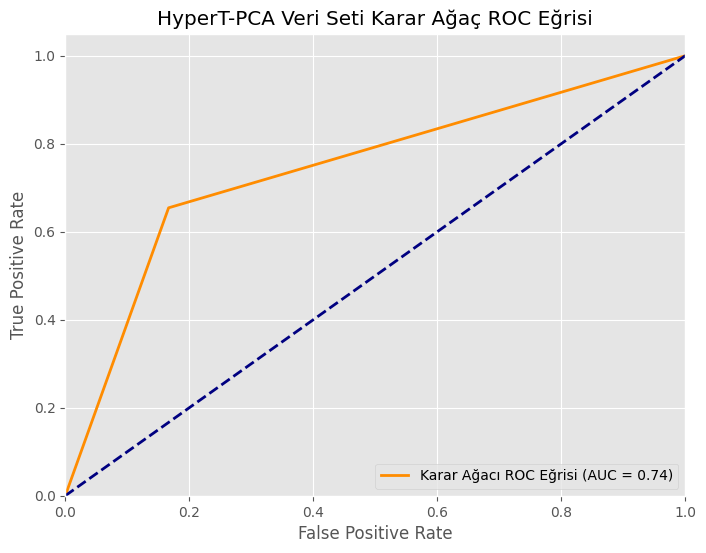

In [454]:
# ROC eğrisi ve AUC hesaplama
fpr_DT_pca, tpr_DT_pca, thresholds_DT_pca = roc_curve(y_test_pca, decision_tree_predictions_pca)
roc_auc_DT_pca = auc(fpr_DT_pca, tpr_DT_pca)

# ROC eğrisini çizme
plt.figure(figsize=(8, 6))
plt.plot(fpr_DT_pca, tpr_DT_pca, color='darkorange', lw=2, label='Karar Ağacı ROC Eğrisi (AUC = %0.2f)' % roc_auc_DT_pca)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('HyperT-PCA Veri Seti Karar Ağaç ROC Eğrisi')
plt.legend(loc="lower right")
plt.show()

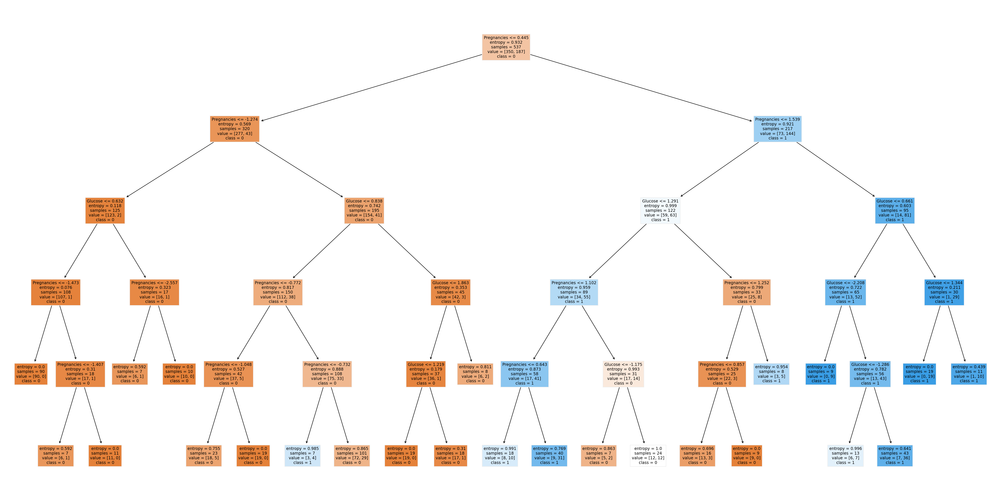

In [353]:
#Karar Ağacı Yapısı
plt.figure(figsize=(20, 10), dpi=300)
plot_tree(decision_tree_model_pca, feature_names=X_scaled.columns, class_names=["0", "1"], filled=True)
plt.show()

# Post Pruning

In [354]:
path_pca=decision_tree_model_pca.cost_complexity_pruning_path(X_train_pca,y_train_pca)
#path variable gives two things ccp_alphas and impurities
ccp_alphas_pca,impurities_pca=path_pca.ccp_alphas,path_pca.impurities
print("ccp alpha wil give list of values :",ccp_alphas_pca)
print("***********************************************************")
print("Impurities in Decision Tree :",impurities_pca)

ccp alpha wil give list of values : [0.         0.00139368 0.00197522 0.00250495 0.00266308 0.00277617
 0.00305686 0.00347775 0.00374174 0.00390061 0.00517406 0.0059779
 0.00742106 0.00755097 0.00856865 0.01024042 0.01174241 0.01889204
 0.03858358 0.04227676 0.2209116 ]
***********************************************************
Impurities in Decision Tree : [0.51162437 0.51301805 0.51499326 0.51749822 0.52016129 0.52293746
 0.52599432 0.53294982 0.53669156 0.54059217 0.54576623 0.55772204
 0.56514309 0.57269406 0.58983136 0.60007178 0.61181419 0.63070623
 0.66928981 0.71156657 0.93247818]


In [355]:
clfs_pca=[]   #will store all the models here
for ccp_alpha in ccp_alphas_pca:
    clf_pca=DecisionTreeClassifier(random_state=42,ccp_alpha=ccp_alpha)
    clf_pca.fit(X_train_pca,y_train_pca)
    clfs_pca.append(clf_pca)
print("Last node in Decision tree is {} and ccp_alpha for last node is {}".format(clfs_pca[-1].tree_.node_count,ccp_alphas_pca[-1]))

Last node in Decision tree is 1 and ccp_alpha for last node is 0.22091160481788674


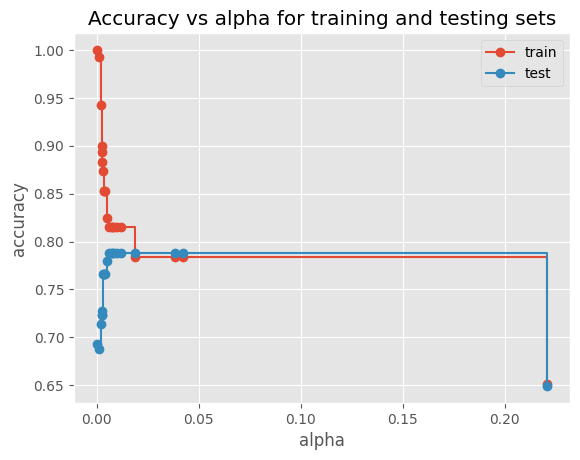

In [356]:
train_scores_pca = [clf_pca.score(X_train_pca, y_train_pca) for clf_pca in clfs_pca]
test_scores_pca = [clf_pca.score(X_test_pca, y_test_pca) for clf_pca in clfs_pca]
fig, ax = plt.subplots()
ax.set_xlabel("alpha")
ax.set_ylabel("accuracy")
ax.set_title("Accuracy vs alpha for training and testing sets")
ax.plot(ccp_alphas_pca, train_scores_pca, marker='o', label="train",drawstyle="steps-post")
ax.plot(ccp_alphas_pca, test_scores_pca, marker='o', label="test",drawstyle="steps-post")
ax.legend()
plt.show()

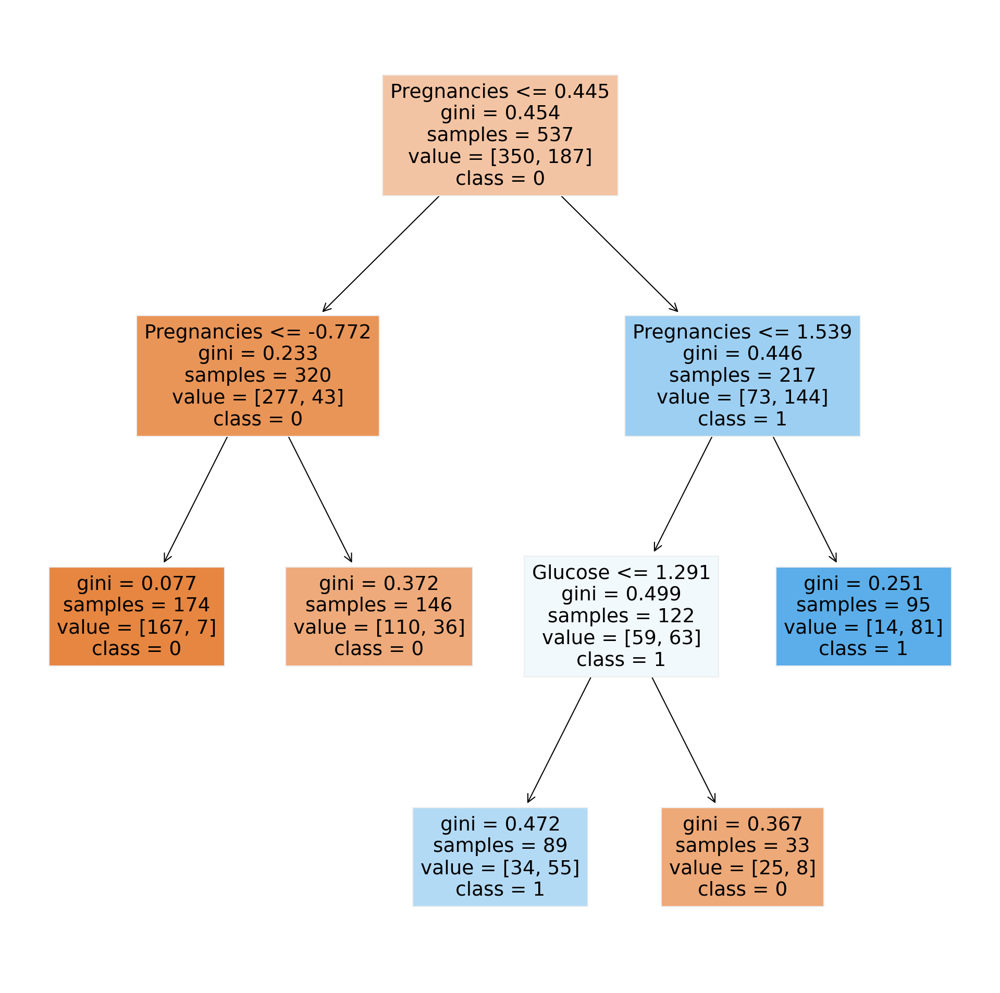

In [365]:
clf_pca=DecisionTreeClassifier(random_state=42,ccp_alpha=0.01)
clf_pca.fit(X_train_pca,y_train_pca)
plt.figure(figsize=(8,8), dpi=300)
plot_tree(clf_pca, feature_names=X_scaled.columns, class_names=["0", "1"], filled=True)
plt.show()

In [366]:
accuracy_score(y_test_pca,clf_pca.predict(X_test_pca))

0.7878787878787878

# Ana Veri Seti Naive Bayes

In [282]:
#Naive Bayes sınıflandırıcısını eğitimi
naive_bayes_model = GaussianNB()
naive_bayes_model.fit(X_train, y_train)

GaussianNB()

In [283]:
#Test verisi üzerinde modelin performansını değerlendirme ve performans metriklerini hesaplama
naive_bayes_predictions = naive_bayes_model.predict(X_test)

In [462]:
# Sınıflandırma raporu oluşturma
classification_rep_NB = classification_report(y_test, naive_bayes_predictions)
print("Ana Veri Seti Naive Bayes Sınıflandırma Raporu:")
print(classification_rep_NB)

Ana Veri Seti Naive Bayes Sınıflandırma Raporu:
              precision    recall  f1-score   support

           0       0.87      0.83      0.85       150
           1       0.70      0.77      0.73        81

    accuracy                           0.81       231
   macro avg       0.79      0.80      0.79       231
weighted avg       0.81      0.81      0.81       231



In [461]:
# Hassasiyet (Sensitivity) ve Özgünlük (Specificity) hesaplama
conf_matrix_NB = confusion_matrix(y_test, naive_bayes_predictions)
tn_NB, fp_NB, fn_NB, tp_NB = conf_matrix_NB.ravel()
sensitivity_NB = tp_NB / (tp_NB + fn_NB)
specificity_NB = tn_NB / (tn_NB + fp_NB)
print("Ana Veri Seti Naive Bayes Sensitivity:", sensitivity_NB)
print("Ana Veri Seti Naive Bayes Specificity:", specificity_NB)

Ana Veri Seti Naive Bayes Sensitivity: 0.7654320987654321
Ana Veri Seti Naive Bayes Specificity: 0.8266666666666667


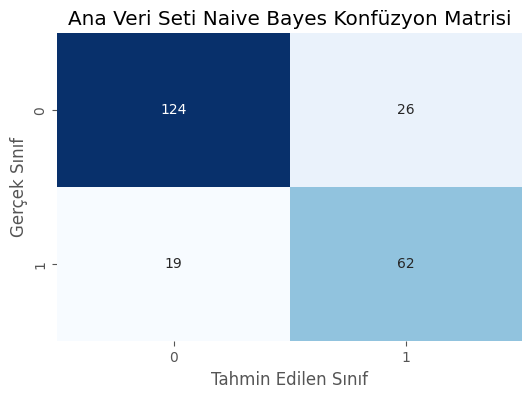

In [460]:
# Konfüzyon matrisi hesaplama
plt.figure(figsize=(6, 4))
sns.heatmap(conf_matrix_NB, annot=True, cmap='Blues', fmt='g', cbar=False)
plt.xlabel('Tahmin Edilen Sınıf')
plt.ylabel('Gerçek Sınıf')
plt.title('Ana Veri Seti Naive Bayes Konfüzyon Matrisi')
plt.show()

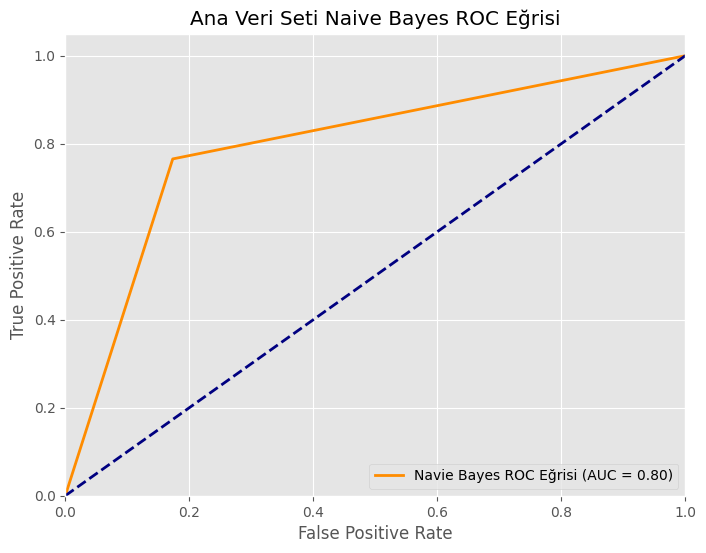

In [459]:
# ROC eğrisi ve AUC hesaplama
fpr_NB, tpr_NB, thresholds_NB = roc_curve(y_test, naive_bayes_predictions)
roc_auc_NB = auc(fpr_NB, tpr_NB)

# ROC eğrisini çizme
plt.figure(figsize=(8, 6))
plt.plot(fpr_NB, tpr_NB, color='darkorange', lw=2, label='Navie Bayes ROC Eğrisi (AUC = %0.2f)' % roc_auc_NB)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Ana Veri Seti Naive Bayes ROC Eğrisi')
plt.legend(loc="lower right")
plt.show()

# PCA Veri Seti Naive Bayes

In [288]:
#PCA-Naive Bayes sınıflandırıcısını eğitimi
naive_bayes_model_pca = GaussianNB()
naive_bayes_model_pca.fit(X_train_pca, y_train_pca)

GaussianNB()

In [289]:
#Test verisi üzerinde modelin performansını değerlendirme ve performans metriklerini hesaplama
naive_bayes_predictions_pca = naive_bayes_model_pca.predict(X_test_pca)

In [463]:
# Sınıflandırma raporu oluşturma
classification_rep_NB_pca = classification_report(y_test_pca, naive_bayes_predictions_pca)
print("PCA Veri Seti Naive Bayes Sınıflandırma Raporu:")
print(classification_rep_NB_pca)

PCA Veri Seti Naive Bayes Sınıflandırma Raporu:
              precision    recall  f1-score   support

           0       0.82      0.83      0.83       150
           1       0.68      0.67      0.68        81

    accuracy                           0.77       231
   macro avg       0.75      0.75      0.75       231
weighted avg       0.77      0.77      0.77       231



In [464]:
# Hassasiyet (Sensitivity) ve Özgünlük (Specificity) hesaplama
conf_matrix_NB_pca = confusion_matrix(y_test_pca, naive_bayes_predictions_pca)
tn_NB_pca, fp_NB_pca, fn_NB_pca, tp_NB_pca = conf_matrix_NB_pca.ravel()
sensitivity_NB_pca = tp_NB_pca / (tp_NB_pca + fn_NB_pca)
specificity_NB_pca = tn_NB_pca / (tn_NB_pca + fp_NB_pca)
print("PCA Veri Seti Naive Bayes Sensitivity:", sensitivity_NB_pca)
print("PCA Veri Seti Naive Bayes Specificity:", specificity_NB_pca)

PCA Veri Seti Naive Bayes Sensitivity: 0.6666666666666666
PCA Veri Seti Naive Bayes Specificity: 0.8333333333333334


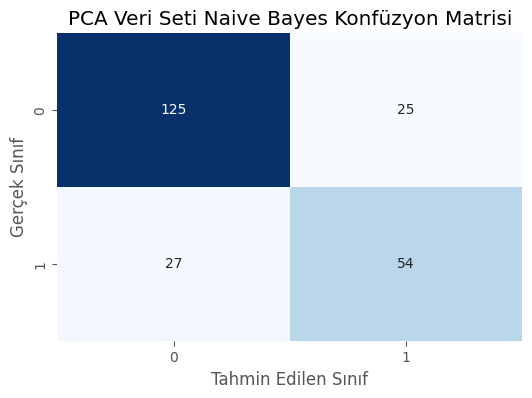

In [465]:
# Konfüzyon matrisi hesaplama
plt.figure(figsize=(6, 4))
sns.heatmap(conf_matrix_NB_pca, annot=True, cmap='Blues', fmt='g', cbar=False)
plt.xlabel('Tahmin Edilen Sınıf')
plt.ylabel('Gerçek Sınıf')
plt.title('PCA Veri Seti Naive Bayes Konfüzyon Matrisi')
plt.show()

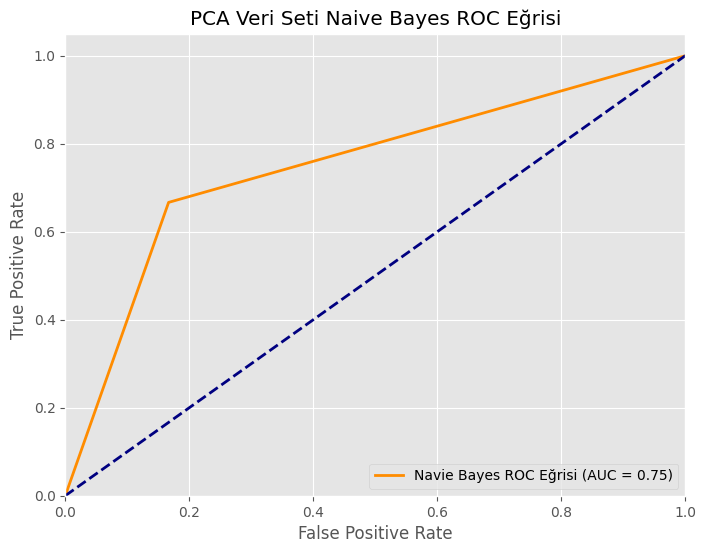

In [466]:
# ROC eğrisi ve AUC hesaplama
fpr_NB_pca, tpr_NB_pca, thresholds_NB_pca = roc_curve(y_test_pca, naive_bayes_predictions_pca)
roc_auc_NB_pca = auc(fpr_NB_pca, tpr_NB_pca)

# ROC eğrisini çizme
plt.figure(figsize=(8, 6))
plt.plot(fpr_NB_pca, tpr_NB_pca, color='darkorange', lw=2, label='Navie Bayes ROC Eğrisi (AUC = %0.2f)' % roc_auc_NB_pca)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('PCA Veri Seti Naive Bayes ROC Eğrisi')
plt.legend(loc="lower right")
plt.show()